In [1]:
from scipy import signal
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from detecta import detect_onset,detect_peaks
from scipy.signal import butter,filtfilt,welch,lfilter, freqz
from tnorma import tnorma
from scipy.integrate import trapz, cumtrapz
from numpy.fft import fft,ifft
import os
from pylab import rcParams
from matplotlib import rc
import matplotlib
import seaborn as sns
from glob import glob
from datetime import datetime
import seaborn as sb
from scipy import stats
import pingouin as pg
import warnings
sns.set_style('whitegrid')

warnings.filterwarnings('ignore')
%matplotlib inline
rcParams['axes.unicode_minus'] = False
rcParams['figure.figsize'] = 7,7
rcParams['savefig.dpi'] = 300
matplotlib.rcParams['font.sans-serif'] = "Arial"
matplotlib.rcParams['font.family'] = "sans-serif"
sns.set(style="whitegrid")
from numpy import median, mean


def butter_notch_filter(data, cutoff_freq, notch_width, sr,order):
    nyquist_freq = 0.5 * sr
    wn = [((cutoff_freq - 0.5 * notch_width) / nyquist_freq), ((cutoff_freq + 0.5 * notch_width) / nyquist_freq)]
    b, a = butter(order, wn, btype='bandstop')
    filtered_data = filtfilt(b, a, data)
    return filtered_data
    
def butter_bandpass_filter(data, lowcut, highcut, sr, order):
    nyq = 0.5 * sr
    # Get the filter coefficients
    b, a = butter(order, [lowcut/nyq,highcut/nyq], btype='bandpass')
    y = filtfilt(b, a, data)
    return y

def butter_lowpass_filter(data, cutoff_freq, sr, order):
    b, a = butter(order, (cutoff_freq/(sr/2.)), btype='low')
    filtered_data = filtfilt(b, a, data)
    return filtered_data


def rolling_rms(x, window_size):
    moving_rms = (pd.DataFrame(abs(x)**2).rolling(window_size).mean()) ** 0.5
    return moving_rms

def resampling(data, origin_sr, resample_sr):
    # Calculate the resampling factor
    resampling_factor = resample_sr / origin_sr
    # Resample the signal
    resampled_signal = signal.resample(data, int(len(data) * resampling_factor))
    resampled_signal = pd.Series(resampled_signal)
    return resampled_signal

## Data Loading

In [2]:
from kcl_dataset import processed_datset

In [4]:
imu_list = sorted(glob("Data/KCL_IMU/**/*csv"))
emg_list = sorted(glob("Data/KCL_EMG/*csv"))
eimu_list = sorted(glob("Data/KCL_EIMU/*csv"))

In [5]:
emg, imu = processed_datset(imu_list, emg_list, eimu_list)

## Sync

In [76]:
noraxon_sr = 200

emg_sync = {}
imu_sync = {}

plot = False
for name in emg:
    ## Data Loading
    imu_df = imu[name]
    emg_imu = eimu[name]
    
    ## Resampling 100 Hz
    resample_sr = 100
    ## ==============================================================================================
    # Noraxon Foot 합가속도 => resampling -> 100 Hz
    norax = imu_df[['RT Foot Accel Sensor X (mG)', 'RT Foot Accel Sensor Y (mG)','RT Foot Accel Sensor Z (mG)']]
    norax_sync = np.sqrt(np.sum(norax**2, axis=1)/3)
    norax_sync = resampling(norax_sync,noraxon_sr,resample_sr)
    

    delsys = emg_imu
    delsys_sync = np.sqrt(np.sum(delsys**2, axis=1)/3)
    
    ## 피크점 찾아 Sync
    noraxon_temp = detect_peaks(norax_sync[:2000], mph = 8000, mpd=300,show=plot)
    delsys_temp = detect_peaks(delsys_sync[:2000], mph = 6, mpd=300, show=plot)
    
    emg_sync[name] = delsys_temp * 10 # 100 Hz -> 1000 Hz (Delsys EMG)
    imu_sync[name] = noraxon_temp * 2 # 100 Hz -> 200 Hz (Myo Motion)
    if plot == True:
        print(f'======================= {name} =========================')

    

In [77]:
wrong = ['S02_C_109','S02_D_109','S03_B_109','S03_D_109','S04_C_102','S04_D_109']
plot = False
for name in wrong:
    imu_df = imu[name]
    emg_imu = eimu[name]
    
    ## Resampling 100 Hz
    resample_sr = 100
    ## ==============================================================================================
    # Noraxon Foot 합가속도 => resampling -> 100 Hz
    norax = imu_df[['RT Foot Accel Sensor X (mG)', 'RT Foot Accel Sensor Y (mG)','RT Foot Accel Sensor Z (mG)']]
    norax_sync = np.sqrt(np.sum(norax**2, axis=1)/3)
    norax_sync = resampling(norax_sync,noraxon_sr,resample_sr)
    
    delsys = emg_imu
    delsys_sync = np.sqrt(np.sum(delsys**2, axis=1)/3)
    
        ## 피크점 찾아 Sync
    noraxon_temp = detect_peaks(norax_sync[:2000], threshold= 10,mph = 6000, mpd=200,show=plot)
    delsys_temp = detect_peaks(delsys_sync[:2000], mph = 6, mpd=200, show=plot)
    
    emg_sync[name] = delsys_temp * 10 # 100 Hz -> 1000 Hz (Delsys EMG)
    imu_sync[name] = noraxon_temp * 2 # 100 Hz -> 200 Hz (Myo Motion)
    if plot == True:
        print(f'======================= {name} =========================')

In [78]:
wrong = ['S09_C_102','S09_D_109']

plot = False
for name in wrong:
    imu_df = imu[name]
    emg_imu = eimu[name]
    
    ## Resampling 100 Hz
    resample_sr = 100
    ## ==============================================================================================
    # Noraxon Foot 합가속도 => resampling -> 100 Hz
    norax = imu_df[['RT Foot Accel Sensor X (mG)', 'RT Foot Accel Sensor Y (mG)','RT Foot Accel Sensor Z (mG)']]
    norax_sync = np.sqrt(np.sum(norax**2, axis=1)/3)
    norax_sync = resampling(norax_sync,noraxon_sr,resample_sr)
    
    delsys = emg_imu
    delsys_sync = np.sqrt(np.sum(delsys**2, axis=1)/3)
    
        ## 피크점 찾아 Sync
    noraxon_temp = detect_peaks(norax_sync[:2000], threshold= 10,mph = 7000, mpd=200,show=plot)
    delsys_temp = detect_peaks(delsys_sync[:2000], mph = 6, mpd=200, show=plot)
    
    emg_sync[name] = delsys_temp * 10 # 100 Hz -> 1000 Hz (Delsys EMG)
    imu_sync[name] = noraxon_temp * 2 # 100 Hz -> 200 Hz (Myo Motion)
    
    if plot == True:
        print(f'======================= {name} =========================')

In [79]:
wrong = ['S09_B_102','S09_B_109','S09_A_102','S09_D_102','S09_A_109']

plot = False
for name in wrong:
    imu_df = imu[name]
    emg_imu = eimu[name]
    
    ## Resampling 100 Hz
    resample_sr = 100
    ## ==============================================================================================
    # Noraxon Foot 합가속도 => resampling -> 100 Hz
    norax = imu_df[['RT Foot Accel Sensor X (mG)', 'RT Foot Accel Sensor Y (mG)','RT Foot Accel Sensor Z (mG)']]
    norax_sync = np.sqrt(np.sum(norax**2, axis=1)/3)
    norax_sync = resampling(norax_sync,noraxon_sr,resample_sr)
    
    delsys = emg_imu
    delsys_sync = np.sqrt(np.sum(delsys**2, axis=1)/3)
    
        ## 피크점 찾아 Sync
    noraxon_temp = detect_peaks(norax_sync[:2000], threshold= 10,mph = 5800, mpd=200,show=plot)
    delsys_temp = detect_peaks(delsys_sync[:2000], mph = 5.5, mpd=200, show=plot)
    
    emg_sync[name] = delsys_temp * 10 # 100 Hz -> 1000 Hz (Delsys EMG)
    imu_sync[name] = noraxon_temp * 2 # 100 Hz -> 200 Hz (Myo Motion)
    if plot == True:
        print(f'======================= {name} =========================')

## Sync Data

In [80]:
sr = 1000
for name in emg_name:
    emg[name] = (emg[name].iloc[emg_sync[name][-1]:,:]).reset_index(drop=True)
    imu[name] = (imu[name].iloc[imu_sync[name][-1]:,:]).reset_index(drop=True)

## EMG Median Frequency

In [7]:
sr = 1000
window = sr * 60 # 1분

MEDIAN = {}
POWER = {}
for name in emg:
    emg_df = emg[name]
    median_df = pd.DataFrame()
    power_df = {}
    
    for col in emg_df.columns:
        Mf = pd.DataFrame()
        Power = pd.DataFrame()
        
        for i in range(int((len(emg_df)/sr)/60)-1):
            d = emg_df[col][i * sr:(i+1) * sr]
            freq, power = welch(d, sr, nperseg=1024)
            power[0] = 0
            power[[83,84,85, 86, 87]] = 0
            power[[73,74,75]] = 0
            power[[221,222,223]] = 0
            power[[147,148,149]] = 0
            power[[167,168,169]] = 0
            power[251:] = 0
            # Calculate the cumulative distribution function of the power spectrum
            cemg = np.cumsum(power)

            # Find the frequency at which the Cemg reaches 50% (the median)
            a = np.argmax(cemg >= cemg[-1]*0.5)
            mf = freq[a]

            Mf[f"{i}"] = pd.Series(mf)
            Power[f"{i}"] = pd.Series(power)
        
        median_df = pd.concat([median_df, Mf.T],axis=1)
        power_df[col] =  Power
    
    median_df.columns = emg_df.columns
    
    MEDIAN[name] = median_df
    POWER[name] = power_df

### 주파수 데이터 나눠서 저장

In [9]:
A102 = {}
A109 = {}
B102 = {}
B109 = {}
C102 = {}
C109 = {}
D102 = {}
D109 = {}

for col in MEDIAN[name].columns:
    a_102 = pd.DataFrame()
    a_109 = pd.DataFrame()
    b_102 = pd.DataFrame()
    b_109 = pd.DataFrame()
    c_102 = pd.DataFrame()
    c_109 = pd.DataFrame()
    d_102 = pd.DataFrame()
    d_109 = pd.DataFrame()
    
    for name in emg:
        if   ('A' in name.split('_')) & ('102' in name.split('_')):
            a_102 = pd.concat([a_102,MEDIAN[name][col] - MEDIAN[name][col][1]],axis=1)
            
        elif ('A' in name.split('_')) & ('109' in name.split('_')):
            a_109 = pd.concat([a_109,MEDIAN[name][col] - MEDIAN[name][col][1]],axis=1)
            
        elif ('B' in name.split('_')) & ('102' in name.split('_')):
            b_102 = pd.concat([b_102,MEDIAN[name][col] - MEDIAN[name][col][1]],axis=1)

        elif ('B' in name.split('_')) & ('109' in name.split('_')):
            b_109 = pd.concat([b_109,MEDIAN[name][col] - MEDIAN[name][col][1]],axis=1)
            
        elif ('C' in name.split('_')) & ('102' in name.split('_')):
            c_102 = pd.concat([c_102,MEDIAN[name][col] - MEDIAN[name][col][1]],axis=1)
            
        elif ('C' in name.split('_')) & ('109' in name.split('_')):
            c_109 = pd.concat([c_109,MEDIAN[name][col] - MEDIAN[name][col][1]],axis=1)
            
        elif ('D' in name.split('_')) & ('102' in name.split('_')):
            d_102 = pd.concat([d_102,MEDIAN[name][col] - MEDIAN[name][col][1]],axis=1)
            
        elif ('D' in name.split('_')) & ('109' in name.split('_')):
            d_109 = pd.concat([d_109,MEDIAN[name][col] - MEDIAN[name][col][1]],axis=1)
            
    A102[col] = a_102
    A109[col] = a_109
    B102[col] = b_102
    B109[col] = b_109
    C102[col] = c_102
    C109[col] = c_109
    D102[col] = d_102
    D109[col] = d_109


In [11]:
NA102 = {}
NA109 = {}
NB102 = {}
NB109 = {}
NC102 = {}
NC109 = {}
ND102 = {}
ND109 = {}

for col in MEDIAN['S02_B_109'].columns:
    a_102 = pd.DataFrame()
    a_109 = pd.DataFrame()
    b_102 = pd.DataFrame()
    b_109 = pd.DataFrame()
    c_102 = pd.DataFrame()
    c_109 = pd.DataFrame()
    d_102 = pd.DataFrame()
    d_109 = pd.DataFrame()
    
    for name in emg:
        if   ('A' in name.split('_')) & ('102' in name.split('_')):
            a_102 = pd.concat([a_102,100*MEDIAN[name][col]/MEDIAN[name][col][1]],axis=1)
            
        elif ('A' in name.split('_')) & ('109' in name.split('_')):
            a_109 = pd.concat([a_109,100*MEDIAN[name][col]/MEDIAN[name][col][1]],axis=1)
            
        elif ('B' in name.split('_')) & ('102' in name.split('_')):
            b_102 = pd.concat([b_102,100*MEDIAN[name][col]/MEDIAN[name][col][1]],axis=1)

        elif ('B' in name.split('_')) & ('109' in name.split('_')):
            b_109 = pd.concat([b_109,100*MEDIAN[name][col]/MEDIAN[name][col][1]],axis=1)
            
        elif ('C' in name.split('_')) & ('102' in name.split('_')):
            c_102 = pd.concat([c_102,100*MEDIAN[name][col]/MEDIAN[name][col][1]],axis=1)
            
        elif ('C' in name.split('_')) & ('109' in name.split('_')):
            c_109 = pd.concat([c_109,100*MEDIAN[name][col]/MEDIAN[name][col][1]],axis=1)
            
        elif ('D' in name.split('_')) & ('102' in name.split('_')):
            d_102 = pd.concat([d_102,100*MEDIAN[name][col]/MEDIAN[name][col][1]],axis=1)
            
        elif ('D' in name.split('_')) & ('109' in name.split('_')):
            d_109 = pd.concat([d_109,100*MEDIAN[name][col]/MEDIAN[name][col][1]],axis=1)
            
    NA102[col] = a_102
    NA109[col] = a_109
    NB102[col] = b_102
    NB109[col] = b_109
    NC102[col] = c_102
    NC109[col] = c_109
    ND102[col] = d_102
    ND109[col] = d_109

### 개별 주파수 그래프 [slopes : Slope 기울기 계수 데이터]
### 개별 주파수 그래프 [nslopes : Normalized Slope 기울기 계수 데이터]

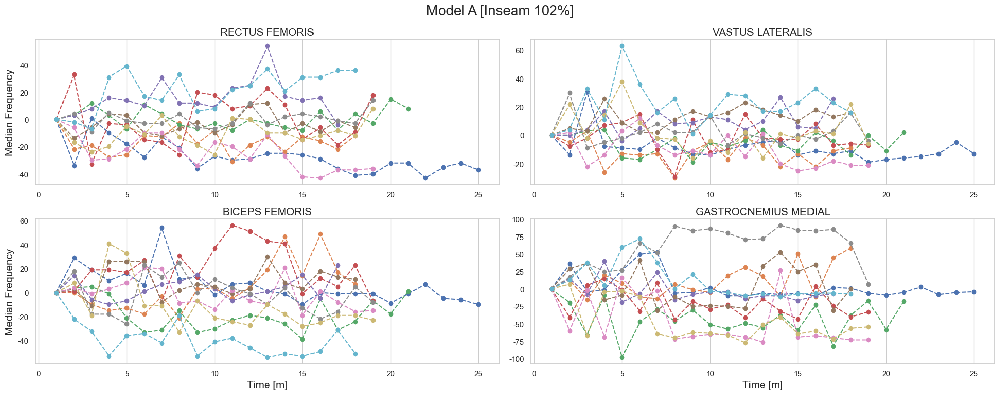

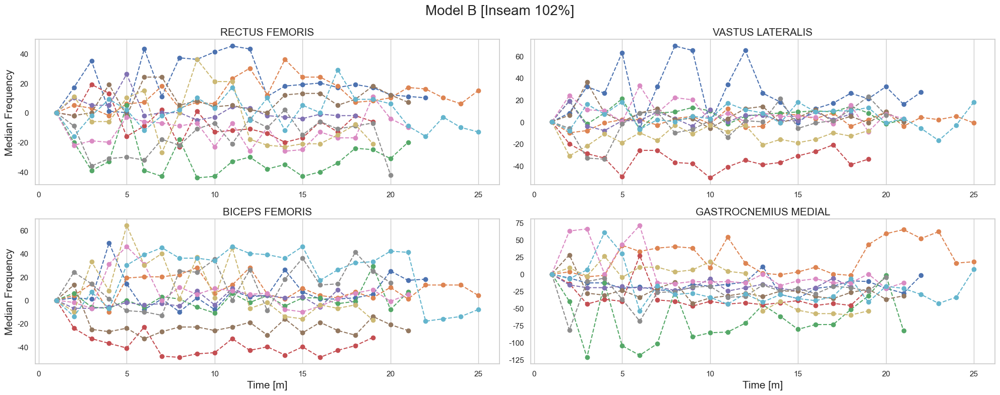

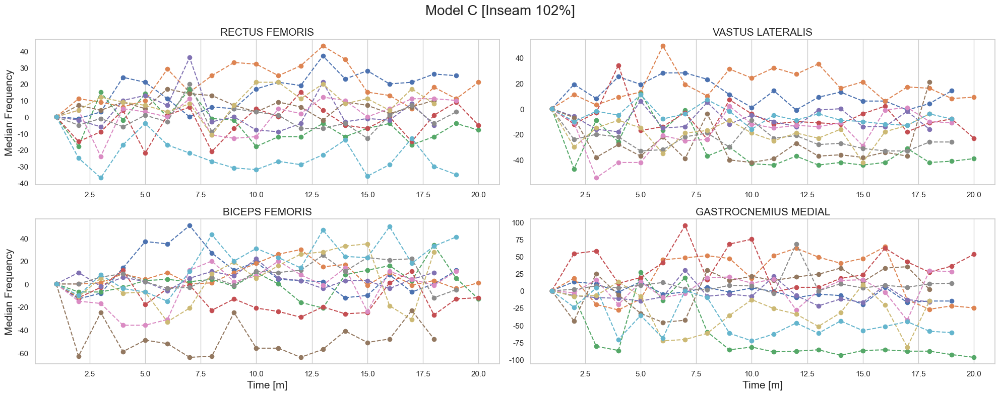

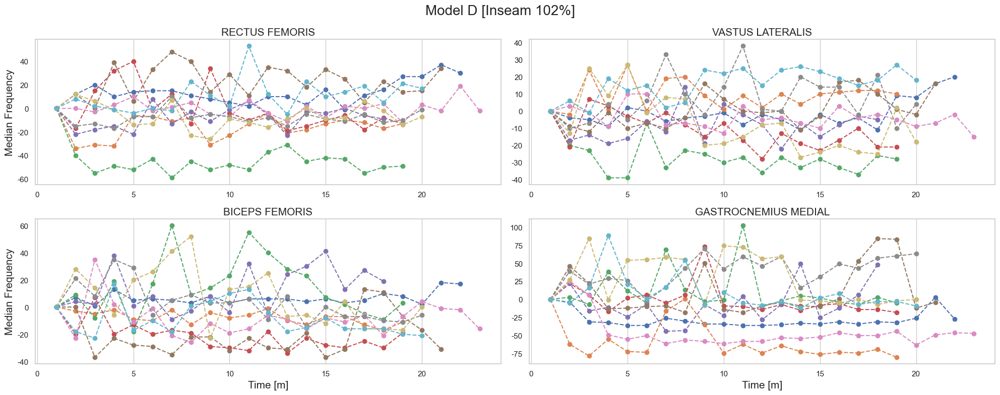

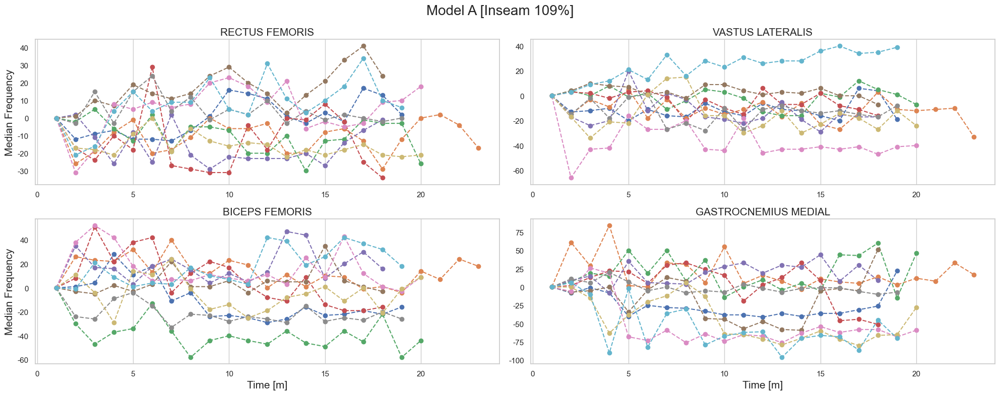

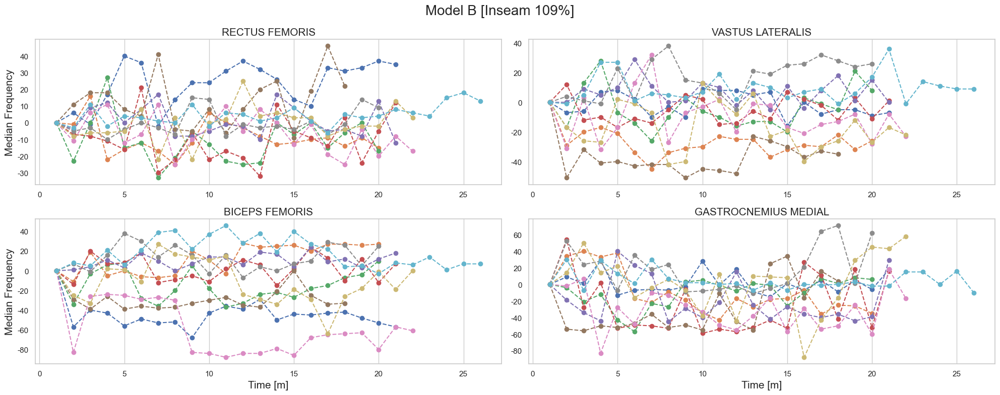

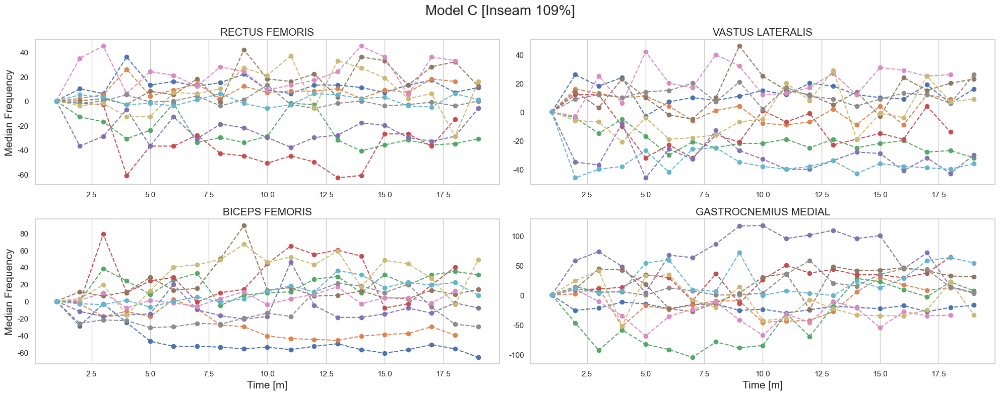

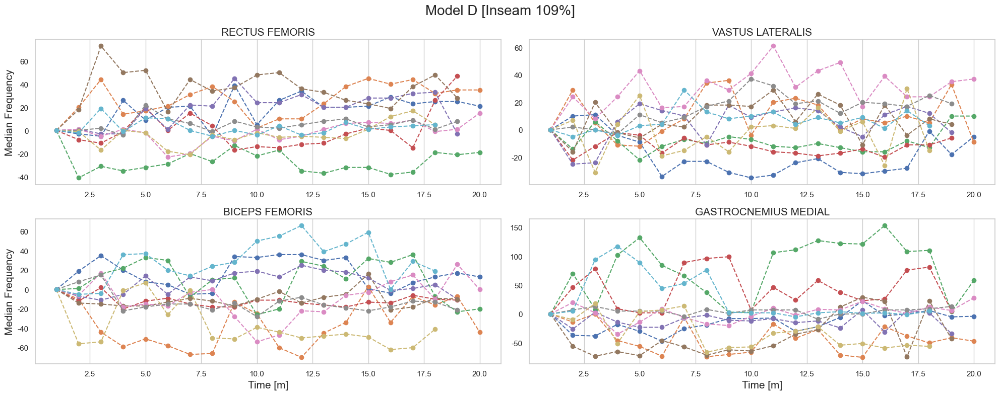

In [12]:
from scipy import stats
for name, group in zip(['Model A [Inseam 102%]','Model B [Inseam 102%]','Model C [Inseam 102%]','Model D [Inseam 102%]',
                        'Model A [Inseam 109%]','Model B [Inseam 109%]','Model C [Inseam 109%]','Model D [Inseam 109%]'],
                       [A102,B102,C102,D102,A109,B109,C109,D109]):
    fig, ax = plt.subplots(2,2, figsize=(20,8))  
    title = f"{name}"  
    fig.suptitle(title, fontsize=20)
    
    sl_df = pd.DataFrame()
    for col in ['RF','VL','BF','GM']:
        sl = []
        df = group[col][1:-1]
        x = np.arange(1,len(df)+1)
        num = len(df.columns)
        
        if col == 'RF':
            a, b = 0,0
            sub_title = 'RECTUS FEMORIS'
        elif col == 'VL':
            a, b = 0,1
            sub_title = 'VASTUS LATERALIS'
        elif col == 'BF':
            a, b = 1,0
            sub_title = 'BICEPS FEMORIS'
        elif col == 'GM':
            a, b = 1,1
            sub_title = 'GASTROCNEMIUS MEDIAL'
            
        for i in range(num):
            y = df.iloc[:,i].dropna()
            x = np.arange(1,len(y) +1)
            ax[a,b].plot(x, y, 'o--')            
            ax[a,b].set_title(sub_title, fontsize=15)
        
        if a == 1:
            ax[a,b].set_xlabel('Time [m]',fontsize=15)
        if b == 0:    
            ax[a,b].set_ylabel('Median Frequency', fontsize=15)
        ax[a,b].grid(axis='y')
        
        
    plt.tight_layout()
    plt.show()


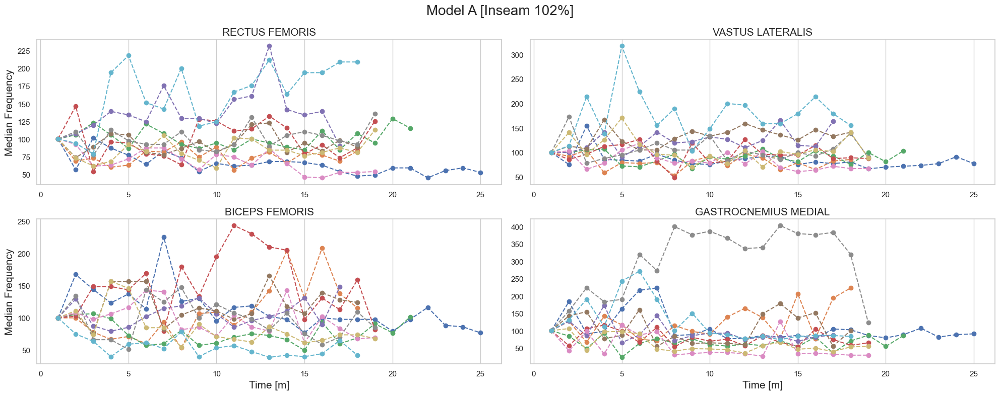

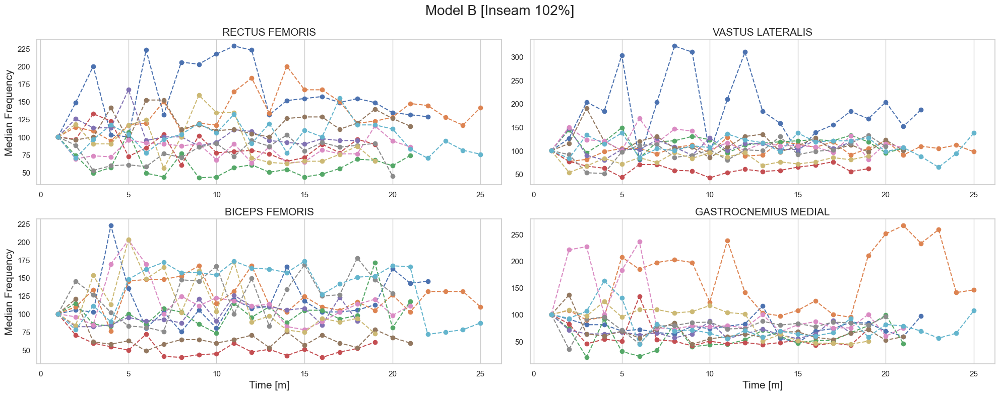

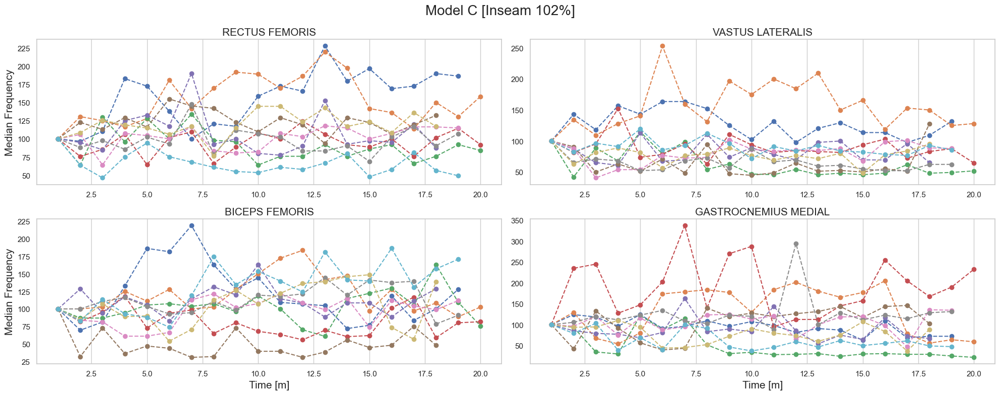

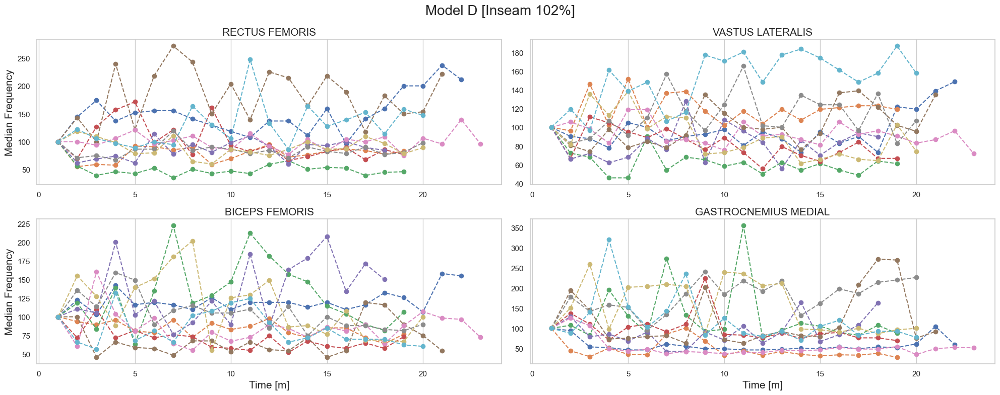

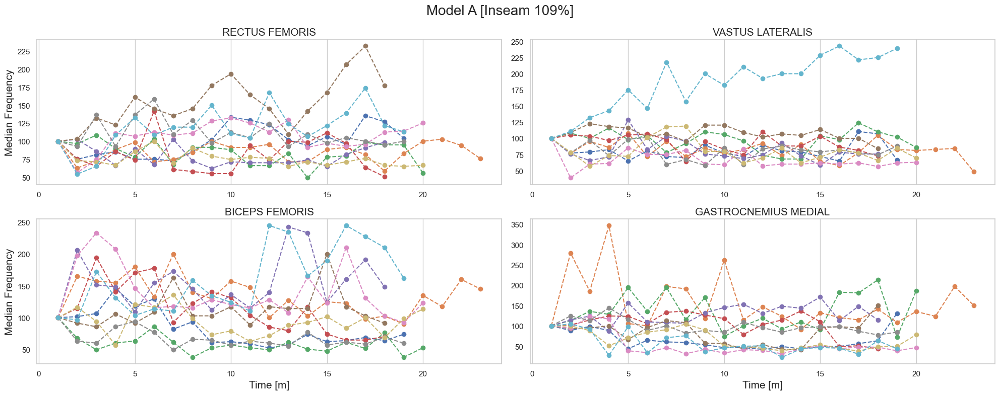

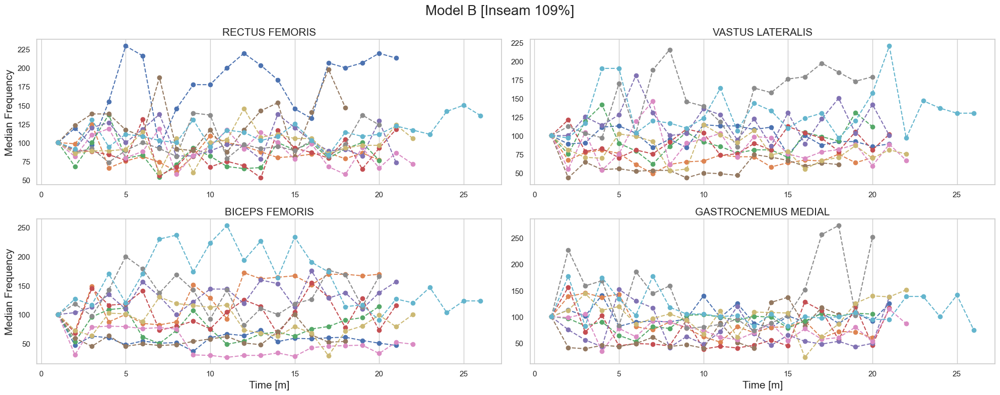

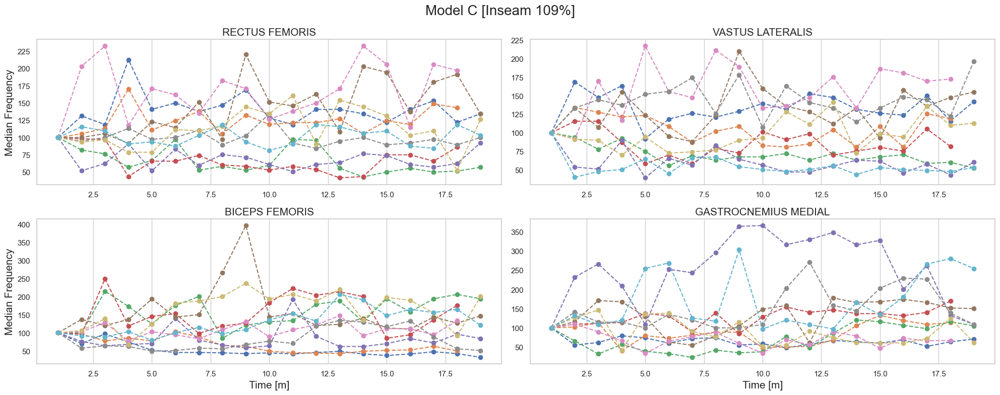

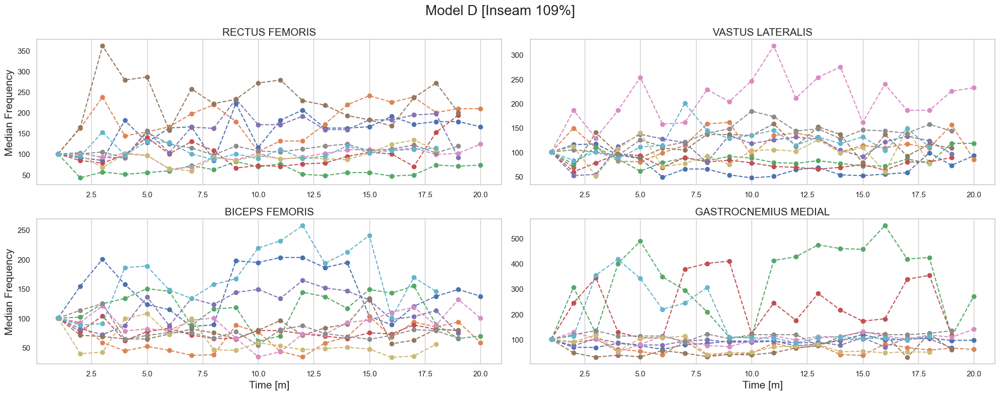

In [13]:
from scipy import stats
for name, group in zip(['Model A [Inseam 102%]','Model B [Inseam 102%]','Model C [Inseam 102%]','Model D [Inseam 102%]',
                        'Model A [Inseam 109%]','Model B [Inseam 109%]','Model C [Inseam 109%]','Model D [Inseam 109%]'],
                       [NA102,NB102,NC102,ND102,NA109,NB109,NC109,ND109]):
    fig, ax = plt.subplots(2,2, figsize=(20,8))  
    title = f"{name}"  
    fig.suptitle(title, fontsize=20)
    
    sl_df = pd.DataFrame()
    for col in ['RF','VL','BF','GM']:
        sl = []
        df = group[col][1:-1]
        x = np.arange(1,len(df)+1)
        num = len(df.columns)
        
        if col == 'RF':
            a, b = 0,0
            sub_title = 'RECTUS FEMORIS'
        elif col == 'VL':
            a, b = 0,1
            sub_title = 'VASTUS LATERALIS'
        elif col == 'BF':
            a, b = 1,0
            sub_title = 'BICEPS FEMORIS'
        elif col == 'GM':
            a, b = 1,1
            sub_title = 'GASTROCNEMIUS MEDIAL'
            
        for i in range(num):
            y = df.iloc[:,i].dropna()
            x = np.arange(1,len(y) +1)
            ax[a,b].plot(x, y, 'o--')            
            ax[a,b].set_title(sub_title, fontsize=15)
        
        if a == 1:
            ax[a,b].set_xlabel('Time [m]',fontsize=15)
        if b == 0:    
            ax[a,b].set_ylabel('Median Frequency', fontsize=15)
        ax[a,b].grid(axis='y')
        
        
    plt.tight_layout()
    plt.show()

In [14]:
# from scipy import stats
# Nslopes = {}
# for name, group in zip(['Model A [Inseam 102%]','Model B [Inseam 102%]','Model C [Inseam 102%]','Model D [Inseam 102%]',
#                         'Model A [Inseam 109%]','Model B [Inseam 109%]','Model C [Inseam 109%]','Model D [Inseam 109%]'],
#                        [NA102,NB102,NC102,ND102,NA109,NB109,NC109,ND109]):
#     fig, ax = plt.subplots(2,2, figsize=(20,8))  
#     title = f"{name}"  
#     fig.suptitle(title, fontsize=20)
    
#     sl_df = pd.DataFrame()
#     for col in ['RF','VL','BF','GM']:
#         sl = []
#         df = group[col][1:-1]
#         x = np.arange(1,len(df)+1)
#         num = len(df.columns)
        
#         if col == 'RF':
#             a, b = 0,0
#             sub_title = 'RECTUS FEMORIS'
#         elif col == 'VL':
#             a, b = 0,1
#             sub_title = 'VASTUS LATERALIS'
#         elif col == 'BF':
#             a, b = 1,0
#             sub_title = 'BICEPS FEMORIS'
#         elif col == 'GM':
#             a, b = 1,1
#             sub_title = 'GASTROCNEMIUS MEDIAL'
            
#         for i in range(num):
#             y = df.iloc[:,i]
#             slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
#             sl.append(slope)
#             ax[a,b].plot(x, y, 'o--')            
#             ax[a,b].set_title(sub_title, fontsize=15)
        
#         if a == 1:
#             ax[a,b].set_xlabel('Time [m]',fontsize=15)
#         if b == 0:    
#             ax[a,b].set_ylabel('Median Frequency', fontsize=15)
#         ax[a,b].grid(axis='y')
        
#         sl = pd.Series(sl,name=col)
#         sl_df = pd.concat([sl_df,sl],axis=1)
        
#     plt.tight_layout()
#     plt.show()
#     Nslopes[name] = sl_df

### 주파수 평균 표준편차

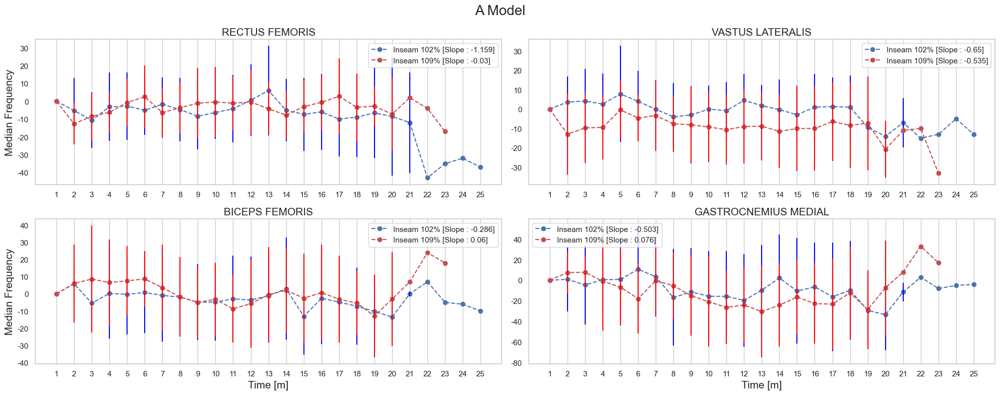

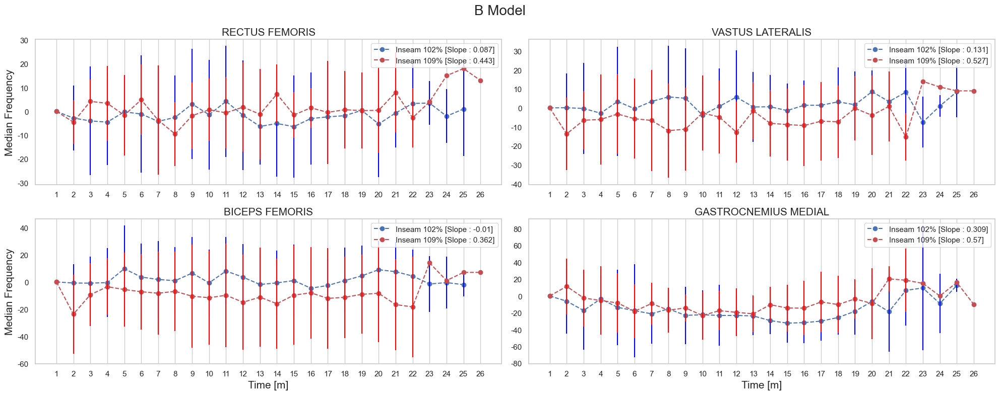

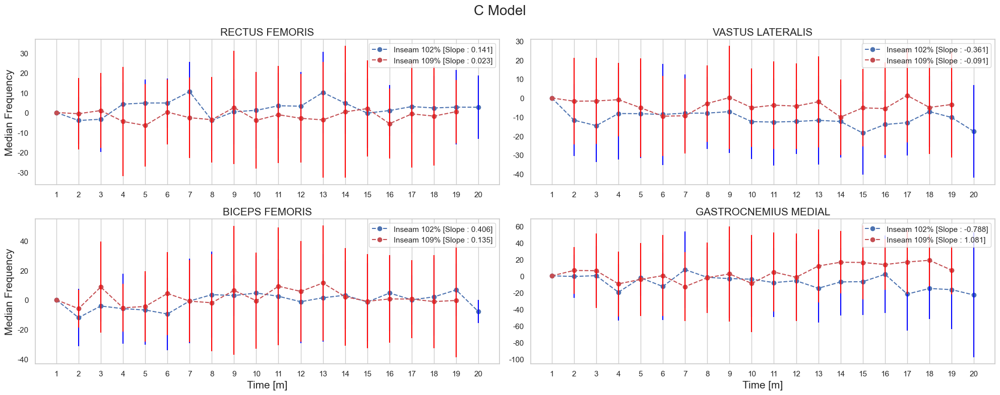

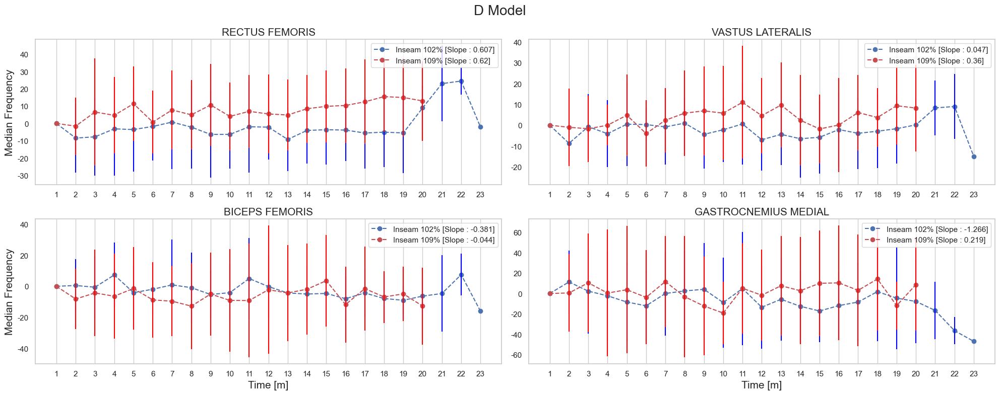

In [15]:
for num, (group1, group2) in enumerate(zip([A102,B102,C102,D102],[A109,B109,C109,D109])):
# for num, (group1, group2) in enumerate(zip([NA102,NB102,NC102,ND102],[NA109,NB109,NC109,ND109])):    
    if num == 0:
        title = 'A Model'
    elif num == 1:
        title = 'B Model'
    elif num == 2:
        title = 'C Model'
    elif num == 3:
        title = 'D Model'
    
    fig, axes = plt.subplots(2,2, figsize=(20,8))    
    fig.suptitle(title, fontsize=20)
    for j, i in enumerate(group1):
        if j == 0:
            a, b = 0,0
        elif j == 1:
            a, b = 0,1
        elif j == 2:
            a, b = 1,0
        elif j == 3:
            a, b = 1,1
        
        y_1, y_2 = group1[i][1:-1].mean(axis=1),group2[i][1:-1].mean(axis=1)
        x_1, x_2 = np.arange(1,len(y_1)+1), np.arange(1,len(y_2)+1)
        slope_1, intercept_1, r_value_1, p_value_1, std_err_1 = stats.linregress(x_1, y_1)
        slope_2, intercept_2, r_value_2, p_value_2, std_err_2 = stats.linregress(x_2, y_2)
        axes[a,b].plot(group1[i][1:-1].mean(axis=1),'bo--',label=f'Inseam 102% [Slope : {round(slope_1,3)}]')
        axes[a,b].vlines(np.arange(len(group1[i][1:-1])),
                group1[i][1:-1].mean(axis=1) - group1[i][1:-1].std(axis=1),
                group1[i][1:-1].mean(axis=1) + group1[i][1:-1].std(axis=1),
                color='blue')
        
        axes[a,b].plot(group2[i][1:-1].mean(axis=1),'ro--',label=f'Inseam 109% [Slope : {round(slope_2,3)}]')
        axes[a,b].vlines(np.arange(len(group2[i][1:-1])),
            group2[i][1:-1].mean(axis=1) - group2[i][1:-1].std(axis=1),
            group2[i][1:-1].mean(axis=1) + group2[i][1:-1].std(axis=1),
            color='red')
        
        axes[a,b].legend()
        if i == 'GM':
            sub_title = 'GASTROCNEMIUS MEDIAL'

        elif i == 'VL':
            sub_title = 'VASTUS LATERALIS'

        elif i == 'RF':
            sub_title = 'RECTUS FEMORIS'

        elif i == 'BF':
            sub_title = 'BICEPS FEMORIS'
            
        axes[a,b].set_title(sub_title, fontsize=15)
        
        if a == 1:
            axes[a,b].set_xlabel('Time [m]',fontsize=15)
        
        if b == 0:    
            axes[a,b].set_ylabel('Median Frequency', fontsize=15)
        axes[a,b].grid(axis='y')

    plt.tight_layout()
    plt.savefig(f'figure/slope_{title}.png')
    plt.show()


### 시간의 흐름에 따른 주파수 변화량 통계

### 전체 구간에서의 비교

In [16]:
dataset = pd.DataFrame()
for sub in MEDIAN:
    data = pd.DataFrame(MEDIAN[sub].copy())
    for col in data.columns:
        data[col] = data[col] / data[col][1]
        
    data['subject'] = sub.split('_')[0]
    data['model'] = sub.split('_')[1]
    data['inseam'] = sub.split('_')[-1]
    data['time'] = np.arange(0,len(data))
    dataset = pd.concat([dataset, data],axis=0)

dataset = dataset.reset_index(drop=True)

In [17]:
df = dataset.groupby(['time','model','inseam']).agg(['mean','std','count'])
length = 0
for i in range(len(df.index)):
    if df.iloc[[i],[2]].values == 10:
        length = i
        
df = df[8:length+1]
minute = df[-2:-1].index[0][0]

group = {}
for time in dataset.groupby('time').groups:
    if time <= minute:
        group[time] = dataset.iloc[dataset.groupby('time').groups[time]]
        group[time] = group[time].reset_index(drop=True)


- Two way repeated measured ANOVA [모델과 안장 높이에 따른 차이]

In [18]:
import pingouin as pg

results = {}
for i in group:
    res = {}
    df = group[i]
    if len(df) == 80:
        for col in df.columns:
            if col in ['RF','VL','BF','GM']:
                two = pg.rm_anova(dv=col,within=['model','inseam'],
                            subject='subject',data=df,
                            detailed=False,correction=True)
                res[col] = two.round(3)
    results[i] = res

In [19]:
for col in ['RF','VL','BF','GM']:
    try:
        for i in results:
            print(f"{i} Minute / {col}")
            display(results[i][col])
    except Exception:
        pass

0 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.355,3,27,0.118,0.861,0.473,0.435,0.031,0.632
1,inseam,0.011,1,9,0.011,0.267,0.618,0.618,0.001,1.000
2,model * inseam,0.265,3,27,0.088,0.463,0.710,0.688,0.023,0.886


1 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN
1,inseam,0.0,1,9,0.0,NaN,NaN,NaN,NaN,1.0
2,model * inseam,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN


2 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.278,3,27,0.093,0.912,0.448,0.425,0.044,0.717
1,inseam,0.001,1,9,0.001,0.024,0.881,0.881,0.000,1.000
2,model * inseam,0.238,3,27,0.079,1.055,0.384,0.367,0.038,0.646


3 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.788,3,27,0.263,1.480,0.242,0.253,0.049,0.717
1,inseam,0.500,1,9,0.500,1.510,0.250,0.250,0.032,1.000
2,model * inseam,0.320,3,27,0.107,0.546,0.655,0.559,0.020,0.555


4 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.392,3,27,0.131,0.575,0.636,0.582,0.029,0.707
1,inseam,0.007,1,9,0.007,0.051,0.826,0.826,0.001,1.000
2,model * inseam,0.272,3,27,0.091,1.511,0.234,0.242,0.020,0.826


5 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.367,3,27,0.122,0.679,0.572,0.545,0.030,0.809
1,inseam,0.067,1,9,0.067,0.453,0.518,0.518,0.006,1.000
2,model * inseam,0.771,3,27,0.257,2.134,0.119,0.141,0.061,0.736


6 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.133,3,27,0.044,0.240,0.868,0.810,0.013,0.737
1,inseam,0.031,1,9,0.031,0.502,0.497,0.497,0.003,1.000
2,model * inseam,0.099,3,27,0.033,0.449,0.720,0.688,0.009,0.840


7 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.118,3,27,0.373,2.263,0.104,0.152,0.076,0.483
1,inseam,0.037,1,9,0.037,0.780,0.400,0.400,0.003,1.000
2,model * inseam,0.336,3,27,0.112,0.926,0.442,0.419,0.024,0.709


8 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.576,3,27,0.192,1.030,0.395,0.386,0.044,0.809
1,inseam,0.000,1,9,0.000,0.001,0.973,0.973,0.000,1.000
2,model * inseam,0.204,3,27,0.068,0.555,0.649,0.579,0.016,0.650


9 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.581,3,27,0.194,1.153,0.346,0.346,0.039,0.988
1,inseam,0.440,1,9,0.440,2.402,0.156,0.156,0.030,1.000
2,model * inseam,0.636,3,27,0.212,1.349,0.279,0.284,0.042,0.732


10 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.122,3,27,0.041,0.217,0.884,0.816,0.010,0.695
1,inseam,0.123,1,9,0.123,0.821,0.388,0.388,0.010,1.000
2,model * inseam,0.202,3,27,0.067,1.178,0.336,0.333,0.016,0.742


11 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.328,3,27,0.109,0.527,0.668,0.616,0.022,0.737
1,inseam,0.002,1,9,0.002,0.017,0.900,0.900,0.000,1.000
2,model * inseam,0.339,3,27,0.113,0.945,0.433,0.399,0.023,0.593


12 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.113,3,27,0.038,0.179,0.910,0.881,0.008,0.840
1,inseam,0.017,1,9,0.017,0.191,0.672,0.672,0.001,1.000
2,model * inseam,0.176,3,27,0.059,0.592,0.626,0.594,0.012,0.814


13 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.377,3,27,0.126,0.558,0.647,0.587,0.025,0.690
1,inseam,0.007,1,9,0.007,0.064,0.805,0.805,0.000,1.000
2,model * inseam,1.098,3,27,0.366,2.870,0.055,0.069,0.070,0.817


14 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.727,3,27,0.242,1.648,0.202,0.220,0.053,0.676
1,inseam,0.234,1,9,0.234,2.498,0.148,0.148,0.018,1.000
2,model * inseam,0.401,3,27,0.134,0.906,0.451,0.416,0.030,0.617


15 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.727,3,27,0.242,1.654,0.200,0.217,0.053,0.713
1,inseam,0.258,1,9,0.258,4.975,0.053,0.053,0.019,1.000
2,model * inseam,0.208,3,27,0.069,0.451,0.719,0.701,0.016,0.910


16 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.400,3,27,0.133,1.148,0.348,0.334,0.039,0.556
1,inseam,0.156,1,9,0.156,3.603,0.090,0.090,0.015,1.000
2,model * inseam,0.497,3,27,0.166,1.427,0.257,0.265,0.047,0.724


17 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.448,3,27,0.149,0.891,0.458,0.425,0.027,0.649
1,inseam,0.686,1,9,0.686,2.607,0.141,0.141,0.041,1.000
2,model * inseam,0.591,3,27,0.197,2.226,0.108,0.131,0.036,0.732


18 Minute / RF
0 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.021,3,27,0.007,0.049,0.985,0.945,0.002,0.628
1,inseam,0.013,1,9,0.013,0.051,0.826,0.826,0.001,1.000
2,model * inseam,0.688,3,27,0.229,1.357,0.277,0.282,0.048,0.724


1 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN
1,inseam,0.0,1,9,0.0,NaN,NaN,NaN,NaN,1.0
2,model * inseam,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN


2 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.023,3,27,0.008,0.058,0.981,0.972,0.003,0.874
1,inseam,0.026,1,9,0.026,0.543,0.480,0.480,0.004,1.000
2,model * inseam,0.775,3,27,0.258,2.947,0.051,0.058,0.101,0.894


3 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.083,3,27,0.028,0.265,0.850,0.768,0.010,0.660
1,inseam,0.013,1,9,0.013,0.095,0.764,0.764,0.002,1.000
2,model * inseam,0.690,3,27,0.230,2.081,0.126,0.158,0.075,0.624


4 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.004,3,27,0.001,0.009,0.999,0.998,0.000,0.89
1,inseam,0.000,1,9,0.000,0.004,0.952,0.952,0.000,1.00
2,model * inseam,0.319,3,27,0.106,0.886,0.461,0.431,0.035,0.68


5 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.317,3,27,0.106,0.374,0.772,0.717,0.016,0.752
1,inseam,0.014,1,9,0.014,0.042,0.843,0.843,0.001,1.000
2,model * inseam,0.432,3,27,0.144,0.736,0.540,0.518,0.022,0.830


6 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.086,3,27,0.029,0.159,0.923,0.820,0.008,0.563
1,inseam,0.103,1,9,0.103,1.027,0.337,0.337,0.010,1.000
2,model * inseam,0.061,3,27,0.020,0.192,0.901,0.848,0.006,0.741


7 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.198,3,27,0.066,0.450,0.719,0.643,0.018,0.660
1,inseam,0.001,1,9,0.001,0.003,0.956,0.956,0.000,1.000
2,model * inseam,0.217,3,27,0.072,0.654,0.587,0.545,0.020,0.735


8 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.350,3,27,0.117,0.571,0.639,0.581,0.024,0.694
1,inseam,0.017,1,9,0.017,0.072,0.794,0.794,0.001,1.000
2,model * inseam,0.721,3,27,0.240,1.484,0.241,0.256,0.047,0.561


9 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.168,3,27,0.056,0.287,0.834,0.779,0.011,0.755
1,inseam,0.016,1,9,0.016,0.091,0.769,0.769,0.001,1.000
2,model * inseam,0.989,3,27,0.330,1.467,0.246,0.251,0.062,0.868


10 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.360,3,27,0.120,0.798,0.506,0.490,0.037,0.851
1,inseam,0.097,1,9,0.097,0.922,0.362,0.362,0.010,1.000
2,model * inseam,0.280,3,27,0.093,0.866,0.471,0.452,0.029,0.799


11 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.725,3,27,0.242,0.973,0.420,0.407,0.044,0.788
1,inseam,0.048,1,9,0.048,0.286,0.605,0.605,0.003,1.000
2,model * inseam,0.630,3,27,0.210,1.501,0.237,0.242,0.039,0.866


12 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.129,3,27,0.043,0.191,0.902,0.867,0.011,0.816
1,inseam,0.056,1,9,0.056,0.575,0.468,0.468,0.005,1.000
2,model * inseam,1.391,3,27,0.464,4.048,0.017,0.034,0.104,0.685


13 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.223,3,27,0.074,0.448,0.721,0.662,0.019,0.727
1,inseam,0.106,1,9,0.106,0.703,0.424,0.424,0.009,1.000
2,model * inseam,0.612,3,27,0.204,1.727,0.185,0.205,0.051,0.685


14 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.249,3,27,0.083,0.481,0.698,0.669,0.022,0.849
1,inseam,0.000,1,9,0.000,0.000,0.984,0.984,0.000,1.000
2,model * inseam,0.436,3,27,0.145,1.332,0.285,0.289,0.038,0.652


15 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.110,3,27,0.037,0.225,0.878,0.764,0.011,0.561
1,inseam,0.041,1,9,0.041,0.363,0.562,0.562,0.004,1.000
2,model * inseam,0.257,3,27,0.086,1.062,0.382,0.376,0.025,0.847


16 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.206,3,27,0.069,0.290,0.832,0.746,0.016,0.648
1,inseam,0.000,1,9,0.000,0.001,0.974,0.974,0.000,1.000
2,model * inseam,0.463,3,27,0.154,1.707,0.189,0.204,0.036,0.755


17 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.093,3,27,0.031,0.176,0.912,0.824,0.009,0.617
1,inseam,0.133,1,9,0.133,1.287,0.286,0.286,0.013,1.000
2,model * inseam,0.549,3,27,0.183,1.796,0.172,0.176,0.053,0.934


18 Minute / VL
0 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.761,3,27,0.254,1.272,0.304,0.305,0.045,0.795
1,inseam,0.000,1,9,0.000,0.001,0.974,0.974,0.000,1.000
2,model * inseam,1.420,3,27,0.473,1.531,0.229,0.242,0.080,0.705


1 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN
1,inseam,0.0,1,9,0.0,NaN,NaN,NaN,NaN,1.0
2,model * inseam,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN


2 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.167,3,27,0.389,4.331,0.013,0.028,0.145,0.679
1,inseam,0.058,1,9,0.058,0.614,0.453,0.453,0.008,1.000
2,model * inseam,0.410,3,27,0.137,1.259,0.308,0.309,0.056,0.943


3 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.289,3,27,0.096,0.578,0.634,0.630,0.022,0.975
1,inseam,0.503,1,9,0.503,3.169,0.109,0.109,0.038,1.000
2,model * inseam,0.595,3,27,0.198,1.179,0.336,0.332,0.045,0.744


4 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.286,3,27,0.095,0.615,0.611,0.541,0.022,0.621
1,inseam,0.001,1,9,0.001,0.008,0.932,0.932,0.000,1.000
2,model * inseam,0.441,3,27,0.147,0.705,0.557,0.531,0.034,0.809


5 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.326,3,27,0.109,0.706,0.557,0.501,0.025,0.637
1,inseam,0.019,1,9,0.019,0.100,0.759,0.759,0.001,1.000
2,model * inseam,0.360,3,27,0.120,0.531,0.665,0.644,0.028,0.882


6 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.359,3,27,0.120,0.668,0.579,0.545,0.030,0.774
1,inseam,0.095,1,9,0.095,0.634,0.446,0.446,0.008,1.000
2,model * inseam,0.354,3,27,0.118,0.674,0.575,0.547,0.029,0.805


7 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.236,3,27,0.079,0.366,0.778,0.709,0.014,0.703
1,inseam,0.002,1,9,0.002,0.005,0.948,0.948,0.000,1.000
2,model * inseam,0.220,3,27,0.073,0.350,0.789,0.672,0.013,0.554


8 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.308,3,27,0.103,0.538,0.660,0.621,0.019,0.789
1,inseam,0.014,1,9,0.014,0.067,0.801,0.801,0.001,1.000
2,model * inseam,0.094,3,27,0.031,0.122,0.946,0.895,0.006,0.703


9 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.703,3,27,0.234,0.642,0.595,0.557,0.035,0.767
1,inseam,0.064,1,9,0.064,0.291,0.602,0.602,0.003,1.000
2,model * inseam,0.421,3,27,0.140,0.569,0.640,0.529,0.021,0.493


10 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.309,3,27,0.103,0.505,0.682,0.626,0.020,0.722
1,inseam,0.001,1,9,0.001,0.003,0.956,0.956,0.000,1.000
2,model * inseam,0.042,3,27,0.014,0.072,0.974,0.922,0.003,0.628


11 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.560,3,27,0.187,0.697,0.562,0.512,0.028,0.673
1,inseam,0.027,1,9,0.027,0.104,0.755,0.755,0.001,1.000
2,model * inseam,0.456,3,27,0.152,0.608,0.616,0.577,0.023,0.770


12 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.159,3,27,0.053,0.223,0.880,0.860,0.008,0.898
1,inseam,0.043,1,9,0.043,0.124,0.733,0.733,0.002,1.000
2,model * inseam,0.330,3,27,0.110,0.403,0.752,0.683,0.016,0.697


13 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.553,3,27,0.184,0.634,0.600,0.576,0.026,0.849
1,inseam,0.387,1,9,0.387,1.450,0.259,0.259,0.018,1.000
2,model * inseam,0.217,3,27,0.072,0.279,0.840,0.766,0.010,0.689


14 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.480,3,27,0.160,0.593,0.625,0.601,0.028,0.855
1,inseam,0.033,1,9,0.033,0.151,0.707,0.707,0.002,1.000
2,model * inseam,0.158,3,27,0.053,0.273,0.845,0.823,0.009,0.890


15 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.139,3,27,0.046,0.175,0.912,0.893,0.008,0.884
1,inseam,0.381,1,9,0.381,1.064,0.329,0.329,0.022,1.000
2,model * inseam,0.182,3,27,0.061,0.735,0.541,0.525,0.011,0.875


16 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.875,3,27,0.292,1.655,0.200,0.212,0.058,0.794
1,inseam,0.098,1,9,0.098,0.485,0.504,0.504,0.007,1.000
2,model * inseam,0.171,3,27,0.057,0.294,0.830,0.801,0.012,0.861


17 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.103,3,27,0.034,0.204,0.893,0.873,0.008,0.892
1,inseam,0.175,1,9,0.175,0.988,0.346,0.346,0.013,1.000
2,model * inseam,0.018,3,27,0.006,0.041,0.989,0.982,0.001,0.877


18 Minute / BF
0 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,2.326,3,27,0.775,2.011,0.136,0.163,0.107,0.662
1,inseam,0.194,1,9,0.194,0.852,0.380,0.380,0.010,1.000
2,model * inseam,0.173,3,27,0.058,0.359,0.783,0.728,0.009,0.755


1 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN
1,inseam,0.0,1,9,0.0,NaN,NaN,NaN,NaN,1.0
2,model * inseam,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN


2 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.231,3,27,0.077,0.263,0.851,0.786,0.011,0.714
1,inseam,0.210,1,9,0.210,0.733,0.414,0.414,0.010,1.000
2,model * inseam,0.099,3,27,0.033,0.089,0.965,0.935,0.005,0.764


3 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.441,3,27,0.480,1.192,0.332,0.329,0.047,0.778
1,inseam,0.439,1,9,0.439,1.457,0.258,0.258,0.015,1.000
2,model * inseam,0.221,3,27,0.074,0.182,0.908,0.837,0.008,0.672


4 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.792,3,27,0.597,0.645,0.593,0.506,0.042,0.534
1,inseam,0.595,1,9,0.595,3.044,0.115,0.115,0.014,1.000
2,model * inseam,0.103,3,27,0.034,0.136,0.937,0.910,0.003,0.826


5 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.829,3,27,0.276,0.531,0.665,0.546,0.022,0.489
1,inseam,0.139,1,9,0.139,0.241,0.635,0.635,0.004,1.000
2,model * inseam,1.134,3,27,0.378,0.924,0.442,0.419,0.030,0.705


6 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.539,3,27,0.180,0.421,0.739,0.700,0.016,0.811
1,inseam,0.009,1,9,0.009,0.023,0.883,0.883,0.000,1.000
2,model * inseam,2.576,3,27,0.859,1.514,0.233,0.244,0.071,0.744


7 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.948,3,27,0.649,1.183,0.335,0.329,0.050,0.674
1,inseam,0.002,1,9,0.002,0.014,0.908,0.908,0.000,1.000
2,model * inseam,1.383,3,27,0.461,0.843,0.482,0.450,0.036,0.695


8 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.855,3,27,0.618,1.026,0.397,0.381,0.045,0.699
1,inseam,0.058,1,9,0.058,0.106,0.752,0.752,0.001,1.000
2,model * inseam,0.214,3,27,0.071,0.159,0.923,0.889,0.005,0.807


9 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.909,3,27,0.636,1.115,0.360,0.356,0.042,0.813
1,inseam,0.004,1,9,0.004,0.006,0.940,0.940,0.000,1.000
2,model * inseam,0.323,3,27,0.108,0.202,0.894,0.805,0.007,0.626


10 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.174,3,27,0.391,0.850,0.479,0.460,0.034,0.798
1,inseam,0.135,1,9,0.135,0.294,0.601,0.601,0.004,1.000
2,model * inseam,0.049,3,27,0.016,0.037,0.990,0.972,0.001,0.735


11 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,3.136,3,27,1.045,1.244,0.313,0.310,0.069,0.590
1,inseam,0.008,1,9,0.008,0.018,0.898,0.898,0.000,1.000
2,model * inseam,0.674,3,27,0.225,0.689,0.567,0.518,0.016,0.681


12 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.720,3,27,0.573,1.117,0.360,0.347,0.042,0.634
1,inseam,0.168,1,9,0.168,0.219,0.651,0.651,0.004,1.000
2,model * inseam,0.689,3,27,0.230,0.685,0.569,0.519,0.017,0.678


13 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,2.699,3,27,0.900,1.769,0.177,0.200,0.068,0.651
1,inseam,0.271,1,9,0.271,0.337,0.576,0.576,0.007,1.000
2,model * inseam,2.092,3,27,0.697,1.556,0.223,0.240,0.053,0.630


14 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,2.016,3,27,0.672,1.451,0.250,0.259,0.056,0.734
1,inseam,0.472,1,9,0.472,0.759,0.406,0.406,0.014,1.000
2,model * inseam,2.503,3,27,0.834,2.080,0.126,0.140,0.069,0.828


15 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,2.201,3,27,0.734,1.494,0.238,0.253,0.060,0.590
1,inseam,1.050,1,9,1.050,1.646,0.232,0.232,0.029,1.000
2,model * inseam,1.891,3,27,0.630,1.686,0.193,0.203,0.052,0.841


16 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,3.014,3,27,1.005,2.144,0.118,0.156,0.070,0.567
1,inseam,0.493,1,9,0.493,0.734,0.414,0.414,0.012,1.000
2,model * inseam,1.803,3,27,0.601,1.275,0.303,0.304,0.043,0.697


17 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.576,3,27,0.525,1.276,0.302,0.304,0.036,0.733
1,inseam,1.634,1,9,1.634,3.019,0.116,0.116,0.037,1.000
2,model * inseam,2.021,3,27,0.674,1.098,0.367,0.360,0.045,0.776


18 Minute / GM


In [20]:
significant = []
for col in ['RF','VL','BF','GM']:
    try:
        for i in results:
            print(f"{i} Minute / {col}")
            display(results[i][col])
            for re in results[i][col]['p-unc']:
                if re <= 0.05:
                    print(f"{i} Minute / {col} is Significant")
                    significant.append(f"{i} Minute / {col}")
    except Exception:
        pass

0 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.355,3,27,0.118,0.861,0.473,0.435,0.031,0.632
1,inseam,0.011,1,9,0.011,0.267,0.618,0.618,0.001,1.000
2,model * inseam,0.265,3,27,0.088,0.463,0.710,0.688,0.023,0.886


1 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN
1,inseam,0.0,1,9,0.0,NaN,NaN,NaN,NaN,1.0
2,model * inseam,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN


2 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.278,3,27,0.093,0.912,0.448,0.425,0.044,0.717
1,inseam,0.001,1,9,0.001,0.024,0.881,0.881,0.000,1.000
2,model * inseam,0.238,3,27,0.079,1.055,0.384,0.367,0.038,0.646


3 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.788,3,27,0.263,1.480,0.242,0.253,0.049,0.717
1,inseam,0.500,1,9,0.500,1.510,0.250,0.250,0.032,1.000
2,model * inseam,0.320,3,27,0.107,0.546,0.655,0.559,0.020,0.555


4 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.392,3,27,0.131,0.575,0.636,0.582,0.029,0.707
1,inseam,0.007,1,9,0.007,0.051,0.826,0.826,0.001,1.000
2,model * inseam,0.272,3,27,0.091,1.511,0.234,0.242,0.020,0.826


5 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.367,3,27,0.122,0.679,0.572,0.545,0.030,0.809
1,inseam,0.067,1,9,0.067,0.453,0.518,0.518,0.006,1.000
2,model * inseam,0.771,3,27,0.257,2.134,0.119,0.141,0.061,0.736


6 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.133,3,27,0.044,0.240,0.868,0.810,0.013,0.737
1,inseam,0.031,1,9,0.031,0.502,0.497,0.497,0.003,1.000
2,model * inseam,0.099,3,27,0.033,0.449,0.720,0.688,0.009,0.840


7 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.118,3,27,0.373,2.263,0.104,0.152,0.076,0.483
1,inseam,0.037,1,9,0.037,0.780,0.400,0.400,0.003,1.000
2,model * inseam,0.336,3,27,0.112,0.926,0.442,0.419,0.024,0.709


8 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.576,3,27,0.192,1.030,0.395,0.386,0.044,0.809
1,inseam,0.000,1,9,0.000,0.001,0.973,0.973,0.000,1.000
2,model * inseam,0.204,3,27,0.068,0.555,0.649,0.579,0.016,0.650


9 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.581,3,27,0.194,1.153,0.346,0.346,0.039,0.988
1,inseam,0.440,1,9,0.440,2.402,0.156,0.156,0.030,1.000
2,model * inseam,0.636,3,27,0.212,1.349,0.279,0.284,0.042,0.732


10 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.122,3,27,0.041,0.217,0.884,0.816,0.010,0.695
1,inseam,0.123,1,9,0.123,0.821,0.388,0.388,0.010,1.000
2,model * inseam,0.202,3,27,0.067,1.178,0.336,0.333,0.016,0.742


11 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.328,3,27,0.109,0.527,0.668,0.616,0.022,0.737
1,inseam,0.002,1,9,0.002,0.017,0.900,0.900,0.000,1.000
2,model * inseam,0.339,3,27,0.113,0.945,0.433,0.399,0.023,0.593


12 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.113,3,27,0.038,0.179,0.910,0.881,0.008,0.840
1,inseam,0.017,1,9,0.017,0.191,0.672,0.672,0.001,1.000
2,model * inseam,0.176,3,27,0.059,0.592,0.626,0.594,0.012,0.814


13 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.377,3,27,0.126,0.558,0.647,0.587,0.025,0.690
1,inseam,0.007,1,9,0.007,0.064,0.805,0.805,0.000,1.000
2,model * inseam,1.098,3,27,0.366,2.870,0.055,0.069,0.070,0.817


14 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.727,3,27,0.242,1.648,0.202,0.220,0.053,0.676
1,inseam,0.234,1,9,0.234,2.498,0.148,0.148,0.018,1.000
2,model * inseam,0.401,3,27,0.134,0.906,0.451,0.416,0.030,0.617


15 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.727,3,27,0.242,1.654,0.200,0.217,0.053,0.713
1,inseam,0.258,1,9,0.258,4.975,0.053,0.053,0.019,1.000
2,model * inseam,0.208,3,27,0.069,0.451,0.719,0.701,0.016,0.910


16 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.400,3,27,0.133,1.148,0.348,0.334,0.039,0.556
1,inseam,0.156,1,9,0.156,3.603,0.090,0.090,0.015,1.000
2,model * inseam,0.497,3,27,0.166,1.427,0.257,0.265,0.047,0.724


17 Minute / RF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.448,3,27,0.149,0.891,0.458,0.425,0.027,0.649
1,inseam,0.686,1,9,0.686,2.607,0.141,0.141,0.041,1.000
2,model * inseam,0.591,3,27,0.197,2.226,0.108,0.131,0.036,0.732


18 Minute / RF
0 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.021,3,27,0.007,0.049,0.985,0.945,0.002,0.628
1,inseam,0.013,1,9,0.013,0.051,0.826,0.826,0.001,1.000
2,model * inseam,0.688,3,27,0.229,1.357,0.277,0.282,0.048,0.724


1 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN
1,inseam,0.0,1,9,0.0,NaN,NaN,NaN,NaN,1.0
2,model * inseam,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN


2 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.023,3,27,0.008,0.058,0.981,0.972,0.003,0.874
1,inseam,0.026,1,9,0.026,0.543,0.480,0.480,0.004,1.000
2,model * inseam,0.775,3,27,0.258,2.947,0.051,0.058,0.101,0.894


3 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.083,3,27,0.028,0.265,0.850,0.768,0.010,0.660
1,inseam,0.013,1,9,0.013,0.095,0.764,0.764,0.002,1.000
2,model * inseam,0.690,3,27,0.230,2.081,0.126,0.158,0.075,0.624


4 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.004,3,27,0.001,0.009,0.999,0.998,0.000,0.89
1,inseam,0.000,1,9,0.000,0.004,0.952,0.952,0.000,1.00
2,model * inseam,0.319,3,27,0.106,0.886,0.461,0.431,0.035,0.68


5 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.317,3,27,0.106,0.374,0.772,0.717,0.016,0.752
1,inseam,0.014,1,9,0.014,0.042,0.843,0.843,0.001,1.000
2,model * inseam,0.432,3,27,0.144,0.736,0.540,0.518,0.022,0.830


6 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.086,3,27,0.029,0.159,0.923,0.820,0.008,0.563
1,inseam,0.103,1,9,0.103,1.027,0.337,0.337,0.010,1.000
2,model * inseam,0.061,3,27,0.020,0.192,0.901,0.848,0.006,0.741


7 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.198,3,27,0.066,0.450,0.719,0.643,0.018,0.660
1,inseam,0.001,1,9,0.001,0.003,0.956,0.956,0.000,1.000
2,model * inseam,0.217,3,27,0.072,0.654,0.587,0.545,0.020,0.735


8 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.350,3,27,0.117,0.571,0.639,0.581,0.024,0.694
1,inseam,0.017,1,9,0.017,0.072,0.794,0.794,0.001,1.000
2,model * inseam,0.721,3,27,0.240,1.484,0.241,0.256,0.047,0.561


9 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.168,3,27,0.056,0.287,0.834,0.779,0.011,0.755
1,inseam,0.016,1,9,0.016,0.091,0.769,0.769,0.001,1.000
2,model * inseam,0.989,3,27,0.330,1.467,0.246,0.251,0.062,0.868


10 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.360,3,27,0.120,0.798,0.506,0.490,0.037,0.851
1,inseam,0.097,1,9,0.097,0.922,0.362,0.362,0.010,1.000
2,model * inseam,0.280,3,27,0.093,0.866,0.471,0.452,0.029,0.799


11 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.725,3,27,0.242,0.973,0.420,0.407,0.044,0.788
1,inseam,0.048,1,9,0.048,0.286,0.605,0.605,0.003,1.000
2,model * inseam,0.630,3,27,0.210,1.501,0.237,0.242,0.039,0.866


12 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.129,3,27,0.043,0.191,0.902,0.867,0.011,0.816
1,inseam,0.056,1,9,0.056,0.575,0.468,0.468,0.005,1.000
2,model * inseam,1.391,3,27,0.464,4.048,0.017,0.034,0.104,0.685


12 Minute / VL is Significant
13 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.223,3,27,0.074,0.448,0.721,0.662,0.019,0.727
1,inseam,0.106,1,9,0.106,0.703,0.424,0.424,0.009,1.000
2,model * inseam,0.612,3,27,0.204,1.727,0.185,0.205,0.051,0.685


14 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.249,3,27,0.083,0.481,0.698,0.669,0.022,0.849
1,inseam,0.000,1,9,0.000,0.000,0.984,0.984,0.000,1.000
2,model * inseam,0.436,3,27,0.145,1.332,0.285,0.289,0.038,0.652


15 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.110,3,27,0.037,0.225,0.878,0.764,0.011,0.561
1,inseam,0.041,1,9,0.041,0.363,0.562,0.562,0.004,1.000
2,model * inseam,0.257,3,27,0.086,1.062,0.382,0.376,0.025,0.847


16 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.206,3,27,0.069,0.290,0.832,0.746,0.016,0.648
1,inseam,0.000,1,9,0.000,0.001,0.974,0.974,0.000,1.000
2,model * inseam,0.463,3,27,0.154,1.707,0.189,0.204,0.036,0.755


17 Minute / VL


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.093,3,27,0.031,0.176,0.912,0.824,0.009,0.617
1,inseam,0.133,1,9,0.133,1.287,0.286,0.286,0.013,1.000
2,model * inseam,0.549,3,27,0.183,1.796,0.172,0.176,0.053,0.934


18 Minute / VL
0 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.761,3,27,0.254,1.272,0.304,0.305,0.045,0.795
1,inseam,0.000,1,9,0.000,0.001,0.974,0.974,0.000,1.000
2,model * inseam,1.420,3,27,0.473,1.531,0.229,0.242,0.080,0.705


1 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN
1,inseam,0.0,1,9,0.0,NaN,NaN,NaN,NaN,1.0
2,model * inseam,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN


2 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.167,3,27,0.389,4.331,0.013,0.028,0.145,0.679
1,inseam,0.058,1,9,0.058,0.614,0.453,0.453,0.008,1.000
2,model * inseam,0.410,3,27,0.137,1.259,0.308,0.309,0.056,0.943


2 Minute / BF is Significant
3 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.289,3,27,0.096,0.578,0.634,0.630,0.022,0.975
1,inseam,0.503,1,9,0.503,3.169,0.109,0.109,0.038,1.000
2,model * inseam,0.595,3,27,0.198,1.179,0.336,0.332,0.045,0.744


4 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.286,3,27,0.095,0.615,0.611,0.541,0.022,0.621
1,inseam,0.001,1,9,0.001,0.008,0.932,0.932,0.000,1.000
2,model * inseam,0.441,3,27,0.147,0.705,0.557,0.531,0.034,0.809


5 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.326,3,27,0.109,0.706,0.557,0.501,0.025,0.637
1,inseam,0.019,1,9,0.019,0.100,0.759,0.759,0.001,1.000
2,model * inseam,0.360,3,27,0.120,0.531,0.665,0.644,0.028,0.882


6 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.359,3,27,0.120,0.668,0.579,0.545,0.030,0.774
1,inseam,0.095,1,9,0.095,0.634,0.446,0.446,0.008,1.000
2,model * inseam,0.354,3,27,0.118,0.674,0.575,0.547,0.029,0.805


7 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.236,3,27,0.079,0.366,0.778,0.709,0.014,0.703
1,inseam,0.002,1,9,0.002,0.005,0.948,0.948,0.000,1.000
2,model * inseam,0.220,3,27,0.073,0.350,0.789,0.672,0.013,0.554


8 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.308,3,27,0.103,0.538,0.660,0.621,0.019,0.789
1,inseam,0.014,1,9,0.014,0.067,0.801,0.801,0.001,1.000
2,model * inseam,0.094,3,27,0.031,0.122,0.946,0.895,0.006,0.703


9 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.703,3,27,0.234,0.642,0.595,0.557,0.035,0.767
1,inseam,0.064,1,9,0.064,0.291,0.602,0.602,0.003,1.000
2,model * inseam,0.421,3,27,0.140,0.569,0.640,0.529,0.021,0.493


10 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.309,3,27,0.103,0.505,0.682,0.626,0.020,0.722
1,inseam,0.001,1,9,0.001,0.003,0.956,0.956,0.000,1.000
2,model * inseam,0.042,3,27,0.014,0.072,0.974,0.922,0.003,0.628


11 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.560,3,27,0.187,0.697,0.562,0.512,0.028,0.673
1,inseam,0.027,1,9,0.027,0.104,0.755,0.755,0.001,1.000
2,model * inseam,0.456,3,27,0.152,0.608,0.616,0.577,0.023,0.770


12 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.159,3,27,0.053,0.223,0.880,0.860,0.008,0.898
1,inseam,0.043,1,9,0.043,0.124,0.733,0.733,0.002,1.000
2,model * inseam,0.330,3,27,0.110,0.403,0.752,0.683,0.016,0.697


13 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.553,3,27,0.184,0.634,0.600,0.576,0.026,0.849
1,inseam,0.387,1,9,0.387,1.450,0.259,0.259,0.018,1.000
2,model * inseam,0.217,3,27,0.072,0.279,0.840,0.766,0.010,0.689


14 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.480,3,27,0.160,0.593,0.625,0.601,0.028,0.855
1,inseam,0.033,1,9,0.033,0.151,0.707,0.707,0.002,1.000
2,model * inseam,0.158,3,27,0.053,0.273,0.845,0.823,0.009,0.890


15 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.139,3,27,0.046,0.175,0.912,0.893,0.008,0.884
1,inseam,0.381,1,9,0.381,1.064,0.329,0.329,0.022,1.000
2,model * inseam,0.182,3,27,0.061,0.735,0.541,0.525,0.011,0.875


16 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.875,3,27,0.292,1.655,0.200,0.212,0.058,0.794
1,inseam,0.098,1,9,0.098,0.485,0.504,0.504,0.007,1.000
2,model * inseam,0.171,3,27,0.057,0.294,0.830,0.801,0.012,0.861


17 Minute / BF


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.103,3,27,0.034,0.204,0.893,0.873,0.008,0.892
1,inseam,0.175,1,9,0.175,0.988,0.346,0.346,0.013,1.000
2,model * inseam,0.018,3,27,0.006,0.041,0.989,0.982,0.001,0.877


18 Minute / BF
0 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,2.326,3,27,0.775,2.011,0.136,0.163,0.107,0.662
1,inseam,0.194,1,9,0.194,0.852,0.380,0.380,0.010,1.000
2,model * inseam,0.173,3,27,0.058,0.359,0.783,0.728,0.009,0.755


1 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN
1,inseam,0.0,1,9,0.0,NaN,NaN,NaN,NaN,1.0
2,model * inseam,0.0,3,27,0.0,NaN,NaN,NaN,NaN,NaN


2 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.231,3,27,0.077,0.263,0.851,0.786,0.011,0.714
1,inseam,0.210,1,9,0.210,0.733,0.414,0.414,0.010,1.000
2,model * inseam,0.099,3,27,0.033,0.089,0.965,0.935,0.005,0.764


3 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.441,3,27,0.480,1.192,0.332,0.329,0.047,0.778
1,inseam,0.439,1,9,0.439,1.457,0.258,0.258,0.015,1.000
2,model * inseam,0.221,3,27,0.074,0.182,0.908,0.837,0.008,0.672


4 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.792,3,27,0.597,0.645,0.593,0.506,0.042,0.534
1,inseam,0.595,1,9,0.595,3.044,0.115,0.115,0.014,1.000
2,model * inseam,0.103,3,27,0.034,0.136,0.937,0.910,0.003,0.826


5 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.829,3,27,0.276,0.531,0.665,0.546,0.022,0.489
1,inseam,0.139,1,9,0.139,0.241,0.635,0.635,0.004,1.000
2,model * inseam,1.134,3,27,0.378,0.924,0.442,0.419,0.030,0.705


6 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,0.539,3,27,0.180,0.421,0.739,0.700,0.016,0.811
1,inseam,0.009,1,9,0.009,0.023,0.883,0.883,0.000,1.000
2,model * inseam,2.576,3,27,0.859,1.514,0.233,0.244,0.071,0.744


7 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.948,3,27,0.649,1.183,0.335,0.329,0.050,0.674
1,inseam,0.002,1,9,0.002,0.014,0.908,0.908,0.000,1.000
2,model * inseam,1.383,3,27,0.461,0.843,0.482,0.450,0.036,0.695


8 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.855,3,27,0.618,1.026,0.397,0.381,0.045,0.699
1,inseam,0.058,1,9,0.058,0.106,0.752,0.752,0.001,1.000
2,model * inseam,0.214,3,27,0.071,0.159,0.923,0.889,0.005,0.807


9 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.909,3,27,0.636,1.115,0.360,0.356,0.042,0.813
1,inseam,0.004,1,9,0.004,0.006,0.940,0.940,0.000,1.000
2,model * inseam,0.323,3,27,0.108,0.202,0.894,0.805,0.007,0.626


10 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.174,3,27,0.391,0.850,0.479,0.460,0.034,0.798
1,inseam,0.135,1,9,0.135,0.294,0.601,0.601,0.004,1.000
2,model * inseam,0.049,3,27,0.016,0.037,0.990,0.972,0.001,0.735


11 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,3.136,3,27,1.045,1.244,0.313,0.310,0.069,0.590
1,inseam,0.008,1,9,0.008,0.018,0.898,0.898,0.000,1.000
2,model * inseam,0.674,3,27,0.225,0.689,0.567,0.518,0.016,0.681


12 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.720,3,27,0.573,1.117,0.360,0.347,0.042,0.634
1,inseam,0.168,1,9,0.168,0.219,0.651,0.651,0.004,1.000
2,model * inseam,0.689,3,27,0.230,0.685,0.569,0.519,0.017,0.678


13 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,2.699,3,27,0.900,1.769,0.177,0.200,0.068,0.651
1,inseam,0.271,1,9,0.271,0.337,0.576,0.576,0.007,1.000
2,model * inseam,2.092,3,27,0.697,1.556,0.223,0.240,0.053,0.630


14 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,2.016,3,27,0.672,1.451,0.250,0.259,0.056,0.734
1,inseam,0.472,1,9,0.472,0.759,0.406,0.406,0.014,1.000
2,model * inseam,2.503,3,27,0.834,2.080,0.126,0.140,0.069,0.828


15 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,2.201,3,27,0.734,1.494,0.238,0.253,0.060,0.590
1,inseam,1.050,1,9,1.050,1.646,0.232,0.232,0.029,1.000
2,model * inseam,1.891,3,27,0.630,1.686,0.193,0.203,0.052,0.841


16 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,3.014,3,27,1.005,2.144,0.118,0.156,0.070,0.567
1,inseam,0.493,1,9,0.493,0.734,0.414,0.414,0.012,1.000
2,model * inseam,1.803,3,27,0.601,1.275,0.303,0.304,0.043,0.697


17 Minute / GM


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,model,1.576,3,27,0.525,1.276,0.302,0.304,0.036,0.733
1,inseam,1.634,1,9,1.634,3.019,0.116,0.116,0.037,1.000
2,model * inseam,2.021,3,27,0.674,1.098,0.367,0.360,0.045,0.776


18 Minute / GM


In [21]:
significant

['12 Minute / VL', '2 Minute / BF']

## Onset Time Cycle

In [23]:
plot = False
sr = 200
window = sr*0.5
cycles = {}
start_re = []
end_re = []

for name in emg:
    knee_traj = imu[name]['Noraxon MyoMotion-Trajectories-Ankle RT-z (mm)']
    df = knee_traj[sr*120:sr*240]-knee_traj[sr*120:sr*240].min()
    df1 = np.diff(df)
    temp = detect_peaks(df1,valley=False, mph=2, mpd=window,show=plot) + len(df[:sr*120])
    start_cycle = []
    for i in range(len(temp)-1):
        if temp[i+1] - temp[i] < 400:
            start_cycle.append([temp[i] * 5,temp[i+1] * 5])
    
    if len(start_cycle) < 30:
        start_re.append(name)
        
    start_cycle = start_cycle[:30]
    
    df2 = knee_traj[-sr*240:-sr*120]-knee_traj[-sr*240:-sr*120].min() 
    df3 = np.diff(df2)
    temp = detect_peaks(df3,valley=False, mph=2, mpd=window,show=plot) + len(knee_traj[:-sr*240])
    end_cycle = []
    for i in range(len(temp)-1):
        if temp[i+1] - temp[i] < 400:
            end_cycle.append([temp[i] * 5,temp[i+1] * 5])
    
    if len(end_cycle) < 30:
        end_re.append(name)
        
    end_cycle = end_cycle[-30:]
    cycle = pd.concat([pd.Series(start_cycle, name='start'), pd.Series(end_cycle,name='end')], axis=1)
    cycles[name] = cycle 
    
    if plot == True:
        print(f'======================{name}')
 

In [24]:
print(f"처음 다시 해야하는 트라이얼 : {start_re}\n끝 다시 해야하는 트라이얼  : {end_re}") 

처음 다시 해야하는 트라이얼 : ['S01_A_102', 'S10_A_109']
끝 다시 해야하는 트라이얼  : ['S10_A_109']


In [25]:
plot = False
re_s = []
re_e = []
for name in ['S01_A_102', 'S10_A_109']:
    knee_traj = imu[name]['Noraxon MyoMotion-Trajectories-Ankle RT-z (mm)']
    df = knee_traj[sr*120:sr*480]-knee_traj[sr*120:sr*480].min()
    df1 = np.diff(df)
    temp = detect_peaks(df1,valley=False, mph=2, mpd=window,show=plot) + len(df[:sr*120])
    start_cycle = []
    for i in range(len(temp)-1):
        if temp[i+1] - temp[i] < 400:
            start_cycle.append([temp[i]*5,temp[i+1]*5])
    
    if len(start_cycle) < 30:
        re_s.append(name)
    
    start_cycle = start_cycle[:30]
    
    df2 = knee_traj[-sr*480:-sr*120]-knee_traj[-sr*480:-sr*120].min() 
    df3 = np.diff(df2)
    temp = detect_peaks(df3,valley=False, mph=2, mpd=window,show=plot) + len(knee_traj[:-sr*480])
    end_cycle = []
    for i in range(len(temp)-1):
        if temp[i+1] - temp[i] < 400:
            end_cycle.append([temp[i]*5,temp[i+1]*5])
    
    if len(end_cycle) < 30:
        re_e.append(name)
    
    end_cycle = end_cycle[-30:]
    
    cycle = pd.concat([pd.Series(start_cycle, name='start'), pd.Series(end_cycle,name='end')], axis=1)
    
    cycles[name] = cycle
    
        
    if plot == True:
        print(f'======================{name}')

In [26]:
print(f"처음 다시 해야하는 트라이얼 : {re_s}\n끝 다시 해야하는 트라이얼  : {re_e}")

처음 다시 해야하는 트라이얼 : []
끝 다시 해야하는 트라이얼  : []


## 적분 근전도 확인

In [27]:
for name in emg:
    df = emg[name][cycles[name]['start'][0][0]-250:cycles[name]['end'][29][-1]]
    
    cols = ['RF','VL','BF','GM']
    for col in cols:
        df[col] = butter_lowpass_filter(df[col], 300, 1000, 2)
        df[col] = rolling_rms(df[col],250)
        
    df = df.iloc[250:,:]
    dfs = df.loc[cycles[name]['start'][0][0]:cycles[name]['start'][29][1]] - df.loc[cycles[name]['start'][0][0]:cycles[name]['start'][29][1]].min()
    dfe = df.loc[cycles[name]['end'][0][0]:cycles[name]['end'][29][1]] - df.loc[cycles[name]['end'][0][0]:cycles[name]['end'][29][1]].min()
    
    rvc = pd.DataFrame()
    for i in range(len(cycles[name])):
        m = dfs.loc[cycles[name]['start'][i][0]:cycles[name]['start'][i][1]].max()
        rvc = pd.concat([rvc,pd.DataFrame(m).T],axis=0)
    
    rvc = rvc.mean()
    dfs = 100 * dfs/rvc
    dfe = 100 * dfe/rvc


    # fig, ax = plt.subplots(2,1)
    # ax[0].plot(dfs)
    # ax[1].plot(dfe)
    # print(name)
    # plt.show()

In [28]:
sr = 1000
dt = 1/sr

inte_df = pd.DataFrame()
emg_rf = {}
for name in emg:
    df = emg[name][cycles[name]['start'][0][0]-250:cycles[name]['end'][29][-1]]

    cols = ['RF','VL','BF','GM']
    for col in cols:
        df[col] = butter_lowpass_filter(df[col],300,1000,4)
        df[col] = rolling_rms(df[col],250)
        
    df = df.iloc[250:,:]
    dfs = df.loc[cycles[name]['start'][0][0]:cycles[name]['start'][29][1]] - df.loc[cycles[name]['start'][0][0]:cycles[name]['start'][29][1]].min()
    dfe = df.loc[cycles[name]['end'][0][0]:cycles[name]['end'][29][1]] - df.loc[cycles[name]['end'][0][0]:cycles[name]['end'][29][1]].min()

    
    rvc = pd.DataFrame()
    for i in range(len(cycles[name])):
        m = df.loc[cycles[name]['start'][i][0]:cycles[name]['start'][i][1]].max()
        rvc = pd.concat([rvc,pd.DataFrame(m).T],axis=0)
    
    rvc = rvc.mean()
    dfs = 100 * dfs/rvc
    dfe = 100 * dfe/rvc
    
    integral = pd.DataFrame()
    for i in range(len(cycles[name])):
        s = cycles[name]['start'][i][0]
        e = cycles[name]['start'][i][1]

        df_cycle = dfs.loc[s:e]
        
        inte = pd.DataFrame(trapz(df_cycle, axis=0) * dt)
        integral = pd.concat([integral,inte.T])
        integral.reset_index(drop=True,inplace=True)
        
    integral.columns = df_cycle.columns
    inte_start = integral.mean()
    inte_start['time'] = 'start'
    integral = pd.DataFrame()
    
        
    for i in range(len(cycles[name])):
        s = cycles[name]['end'][i][0]
        e = cycles[name]['end'][i][1]

        df_cycle = dfe.loc[s:e]
        
        inte = pd.DataFrame(trapz(df_cycle, axis=0) * dt)
        integral = pd.concat([integral,inte.T])
        integral.reset_index(drop=True,inplace=True)
        
    integral.columns = df_cycle.columns
    inte_end = integral.mean()
    inte_end['time'] = 'end'
    
    inte = pd.concat([inte_start,inte_end],axis=1).T
    inte['subject'] = f"{name.split('_')[0]}"
    inte['model'] = f"{name.split('_')[-2]}"
    inte['inseam'] = f"{name.split('_')[-1]}"
    inte_df = pd.concat([inte_df,inte])

inte_diff = inte_df.loc[0,:'GM'].reset_index(drop=True) - inte_df.loc[1,:'GM'].reset_index(drop=True)
inte_diff = pd.concat([inte_diff, inte_df.loc[0]['model'].reset_index(drop=True)],axis=1)
inte_diff = pd.concat([inte_diff, inte_df.loc[0]['inseam'].reset_index(drop=True)],axis=1)
inte_diff = pd.concat([inte_diff, inte_df.loc[0]['subject'].reset_index(drop=True)],axis=1)
inte_df.reset_index(drop=True, inplace=True)

inte_df.iloc[:,:-4] = inte_df.iloc[:,:-4].astype(float)
inte_diff.iloc[:,:-3] = inte_diff.iloc[:,:-3].astype(float)

In [29]:
# inte_diff.to_csv('통계/inte_diff.csv',index=False)

In [30]:
slopes = pd.DataFrame()
for name in MEDIAN:
    df = MEDIAN[name][1:-1]
    slope = []
    for muscle in ['RF','VL','BF','GM']:
        y = df[muscle].values - df[muscle].values[0]
        x = df.index.astype(float)
        sl, intercept, r_value, p_value, std_err = stats.linregress(x, y)
        slope.append(sl)

    slope = pd.DataFrame(slope).T
    slope.columns=['RF','VL','BF','GM']
    slope['subject'] = name.split('_')[0]
    slope['model'] = name.split('_')[1]
    slope['inseam'] = name.split('_')[2]
    slopes = pd.concat([slopes, slope],axis=0)

In [31]:
nslopes = pd.DataFrame()
for name in MEDIAN:
    df = MEDIAN[name][1:-1]
    slope = []
    for muscle in ['RF','VL','BF','GM']:
        y = 100*df[muscle].values/df[muscle].values[0]
        x = df.index.astype(float)
        sl, intercept, r_value, p_value, std_err = stats.linregress(x, y)
        slope.append(sl)

    slope = pd.DataFrame(slope).T
    slope.columns=['RF','VL','BF','GM']
    slope['subject'] = name.split('_')[0]
    slope['model'] = name.split('_')[1]
    slope['inseam'] = name.split('_')[2]
    nslopes = pd.concat([nslopes, slope],axis=0)

### 정규성 검정 & 등분산 검정

In [32]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from tqdm import tqdm

  0%|          | 0/4 [00:00<?, ?it/s]

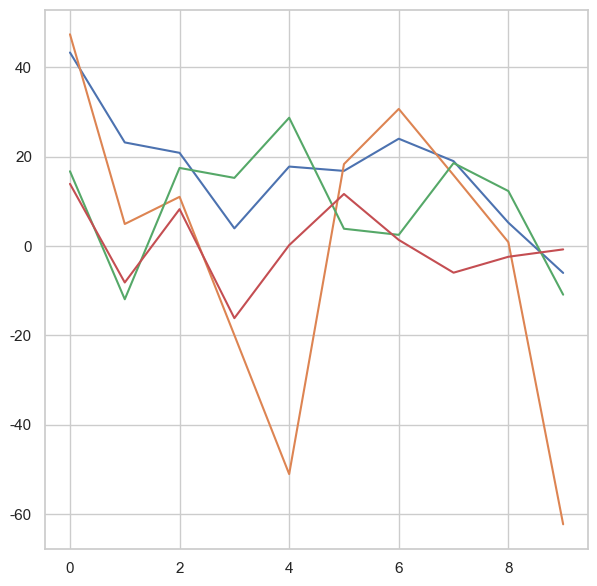

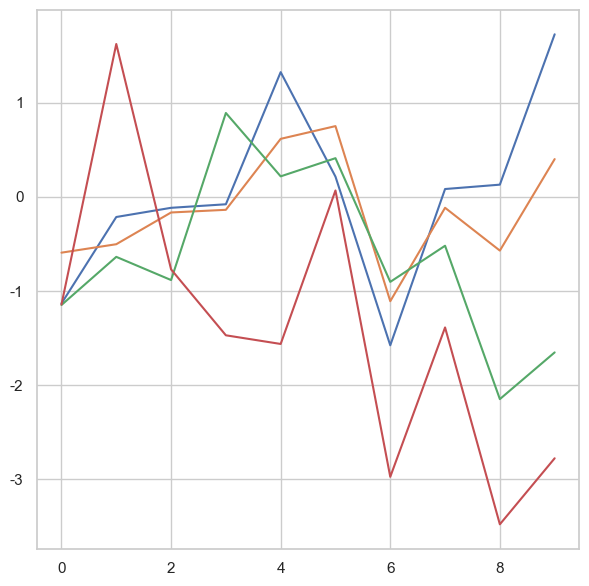

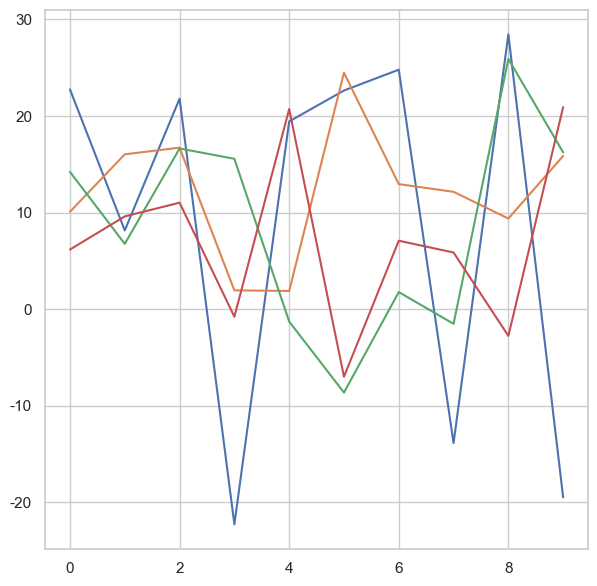

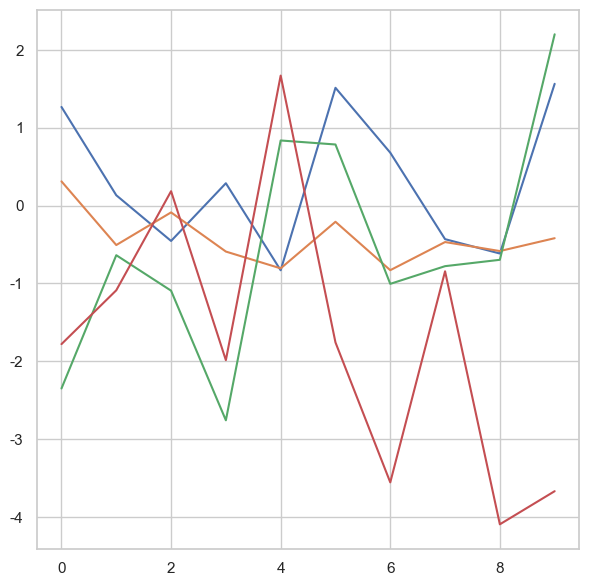

 25%|██▌       | 1/4 [00:00<00:01,  1.72it/s]

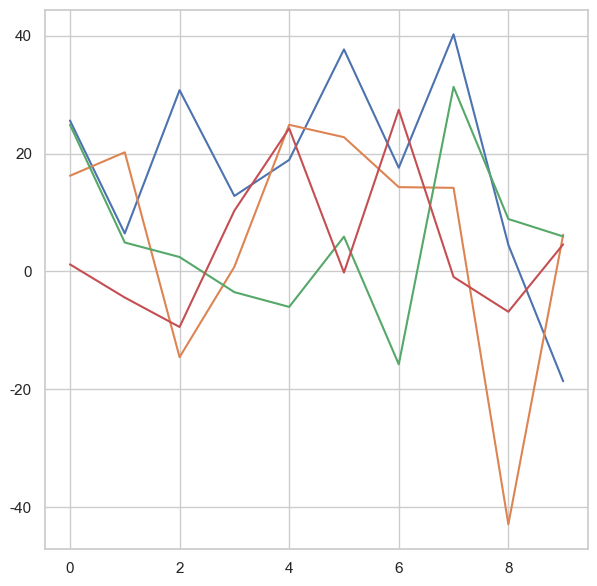

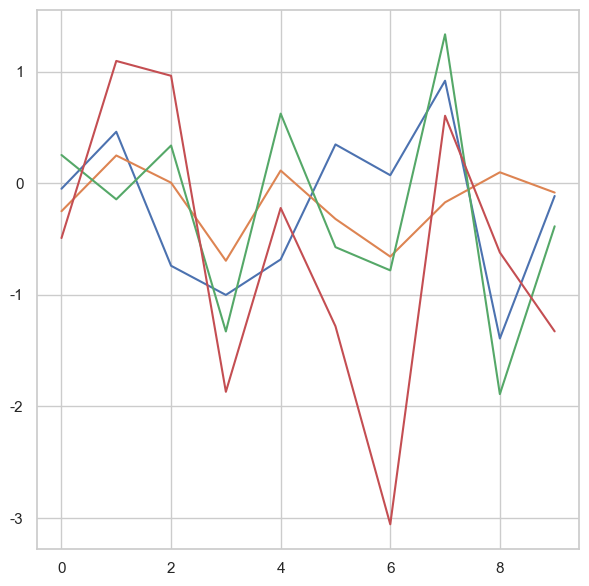

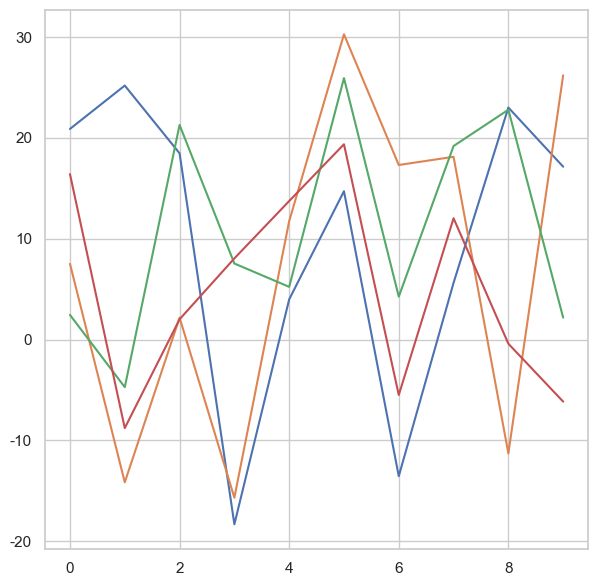

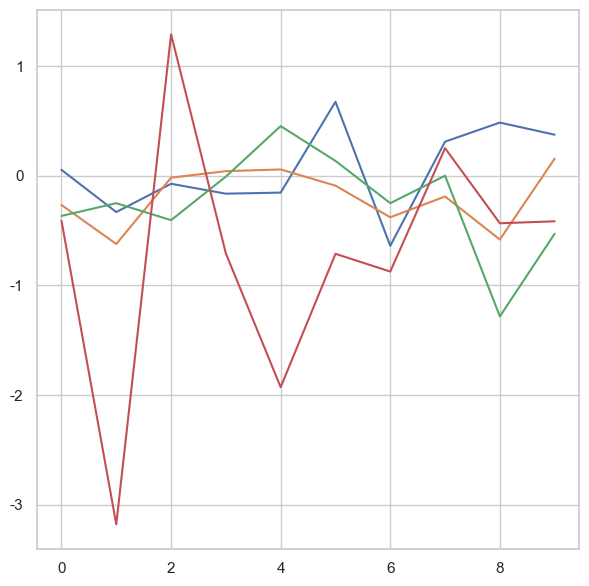

 50%|█████     | 2/4 [00:01<00:01,  1.94it/s]

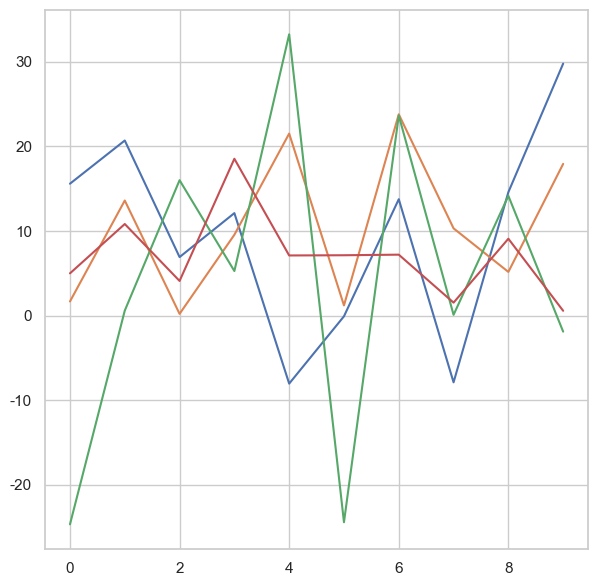

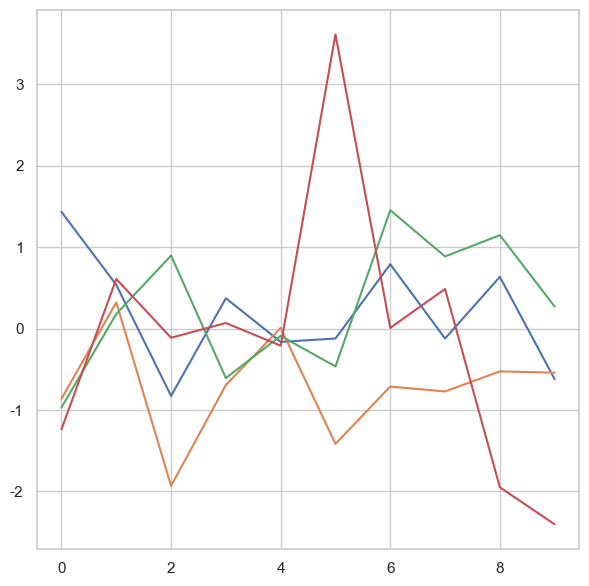

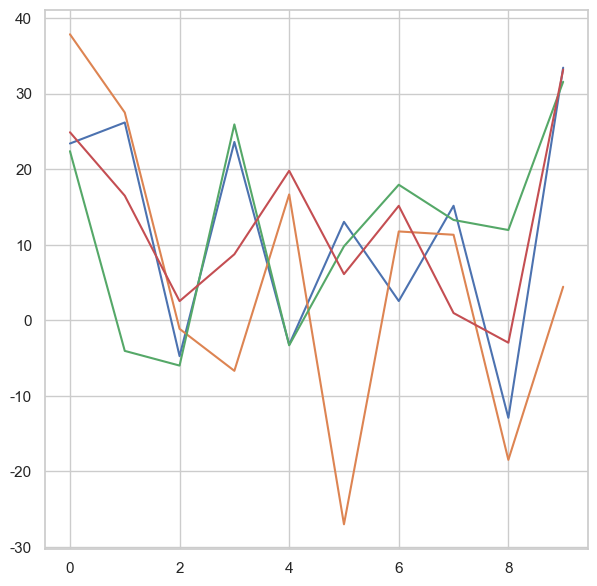

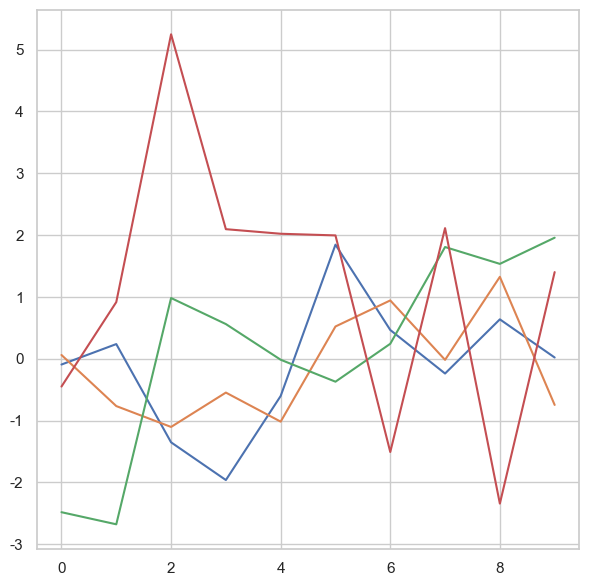

 75%|███████▌  | 3/4 [00:01<00:00,  2.00it/s]

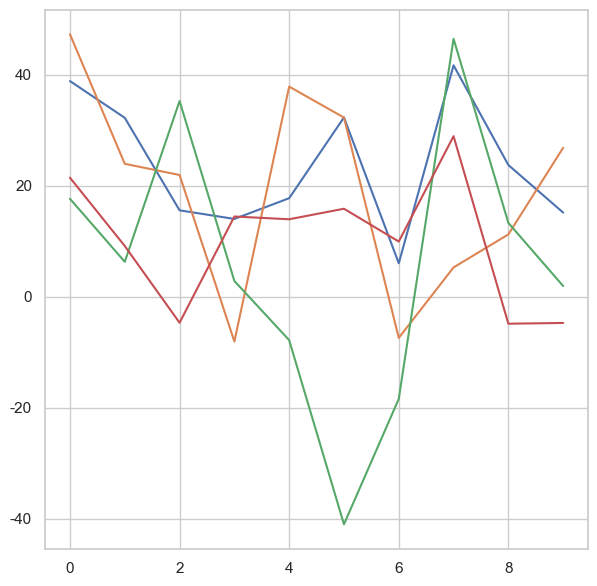

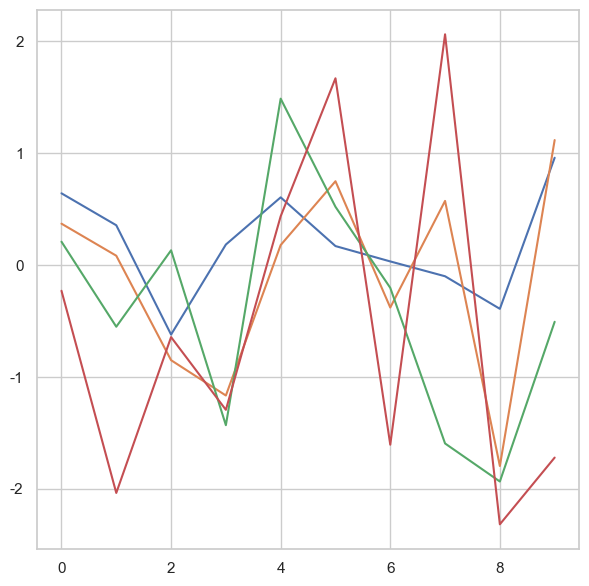

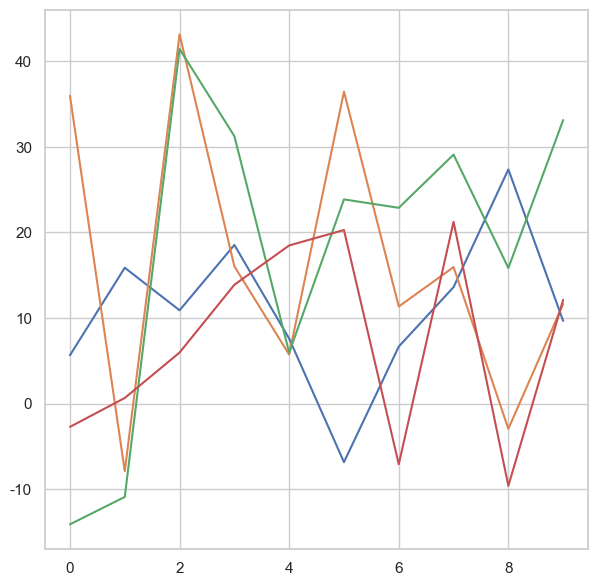

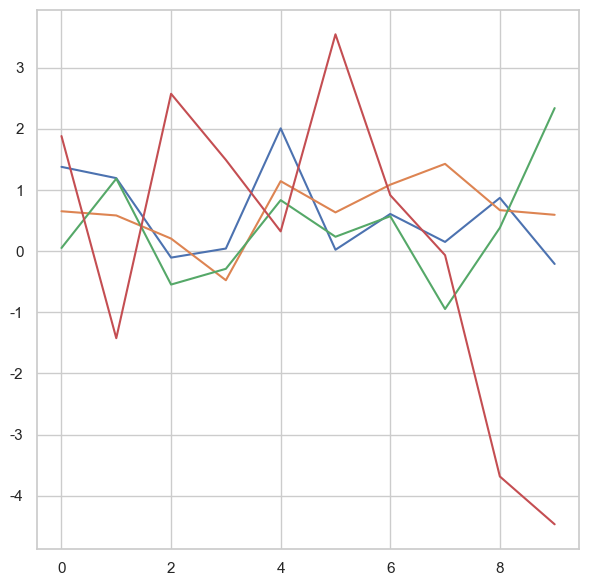

100%|██████████| 4/4 [00:02<00:00,  1.99it/s]


In [33]:
models = ['A','B','C','D']
inseams = ['102', '109']

slopes_process = pd.DataFrame()
inte_process = pd.DataFrame()
for model in tqdm(models):
    for inseam in inseams:
        inte_sc = StandardScaler()
        slope_sc = StandardScaler()
        
        sl = slopes[(slopes['model'] == model) & (slopes['inseam'] == inseam)].copy()
        inte = inte_diff[(inte_diff['model'] == model) & (inte_diff['inseam'] == inseam)].copy()
        
        inte_z = pd.DataFrame(inte_sc.fit_transform(inte[['RF','VL','BF','GM']]), columns= ['RF','VL','BF','GM'])
        slope_z = pd.DataFrame(slope_sc.fit_transform(sl[['RF','VL','BF','GM']]), columns=['RF','VL','BF','GM'])
        
        inte_z = inte_z[abs(inte_z) < 2]
        slope_z = slope_z[abs(slope_z) < 2]
        
        inte[['RF','VL','BF','GM']] = inte_sc.inverse_transform(inte_z)
        sl[['RF','VL','BF','GM']] = slope_sc.inverse_transform(slope_z)
        
        inte_si = SimpleImputer(strategy = 'mean')
        slope_si = SimpleImputer(strategy = 'mean')

        inte[['RF','VL','BF','GM']] = inte_si.fit_transform(inte[['RF','VL','BF','GM']])
        sl[['RF','VL','BF','GM']] = slope_si.fit_transform(sl[['RF','VL','BF','GM']])
        
        slopes_process = pd.concat([slopes_process, sl])
        inte_process = pd.concat([inte_process, inte])

        plt.plot(np.arange(len(inte)),inte[['RF','VL','BF','GM']])
        plt.show()
        plt.plot(np.arange(len(sl)),sl[['RF','VL','BF','GM']])
        plt.show()

In [34]:
inte_sc = StandardScaler()
slope_sc = StandardScaler()

sl = slopes.copy()
inte = inte_diff.copy()

inte_z = pd.DataFrame(inte_sc.fit_transform(inte[['RF','VL','BF','GM']]), columns= ['RF','VL','BF','GM'])
slope_z = pd.DataFrame(slope_sc.fit_transform(sl[['RF','VL','BF','GM']]), columns=['RF','VL','BF','GM'])

inte_z = inte_z[abs(inte_z) < 2]
slope_z = slope_z[abs(slope_z) < 2]

inte[['RF','VL','BF','GM']] = inte_sc.inverse_transform(inte_z)
sl[['RF','VL','BF','GM']] = slope_sc.inverse_transform(slope_z)

inte[['RF','VL','BF','GM']] = inte[['RF','VL','BF','GM']].fillna(inte[['RF','VL','BF','GM']].median())
sl[['RF','VL','BF','GM']] = sl[['RF','VL','BF','GM']].fillna(sl[['RF','VL','BF','GM']].median())

inte

,RF,VL,BF,GM,model,inseam,subject
0,43.310396,47.387282,16.718439,13.899933,A,102,S01
1,22.751148,10.082167,14.210982,6.171158,A,109,S01
2,25.609198,16.233500,24.889044,1.208419,B,102,S01
3,20.870903,7.500905,2.438757,16.391185,B,109,S01
4,15.587813,1.667803,-24.676586,4.990295,C,102,S01
...,...,...,...,...,...,...,...
75,17.128043,26.183647,2.173961,-6.150570,B,109,S10
76,29.784593,17.929585,-1.898772,0.563861,C,102,S10
77,33.448953,4.448409,31.582495,33.197723,C,109,S10
78,15.160517,26.844439,1.928510,-4.720840,D,102,S10


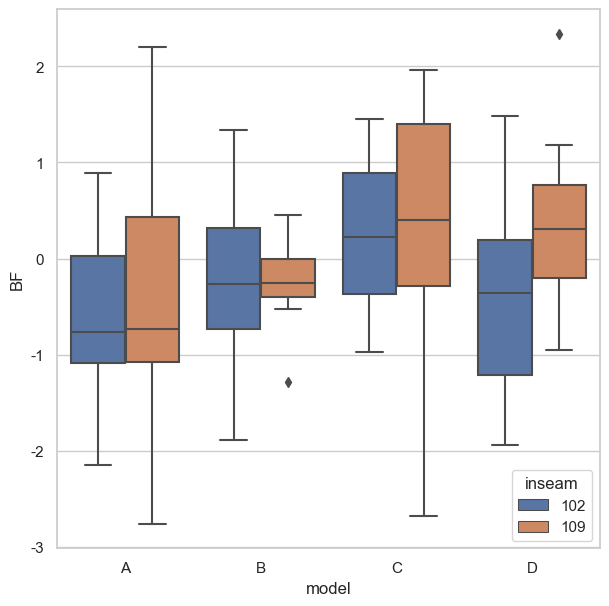

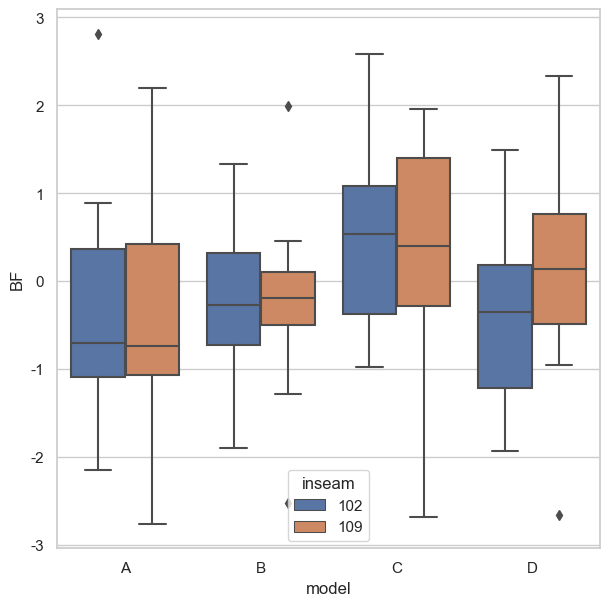

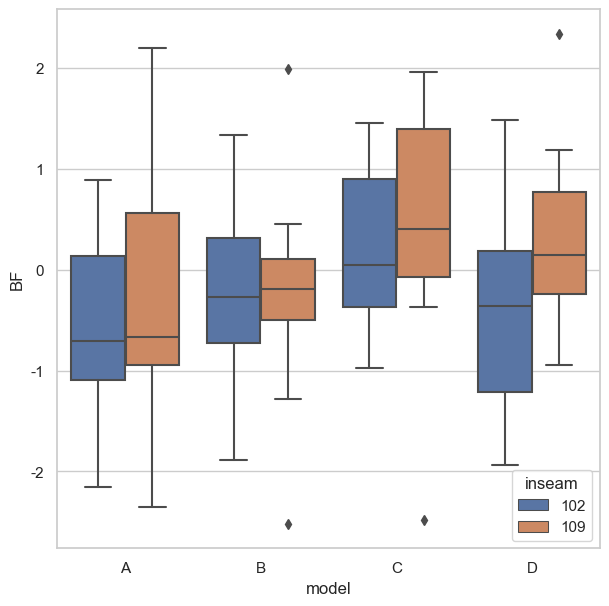

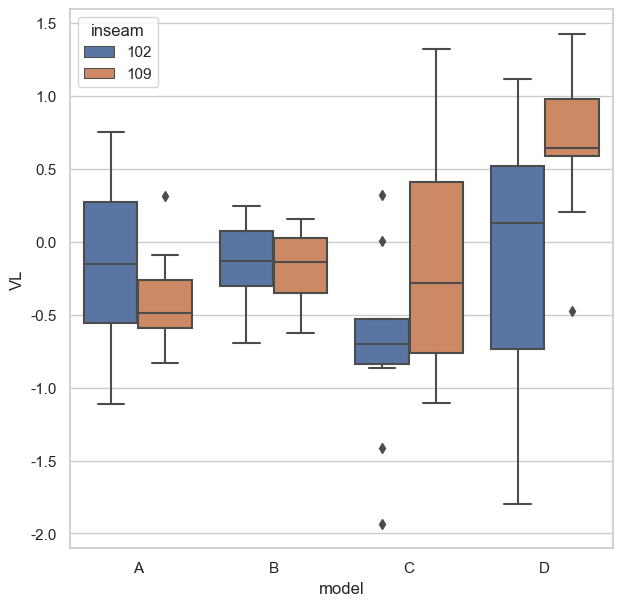

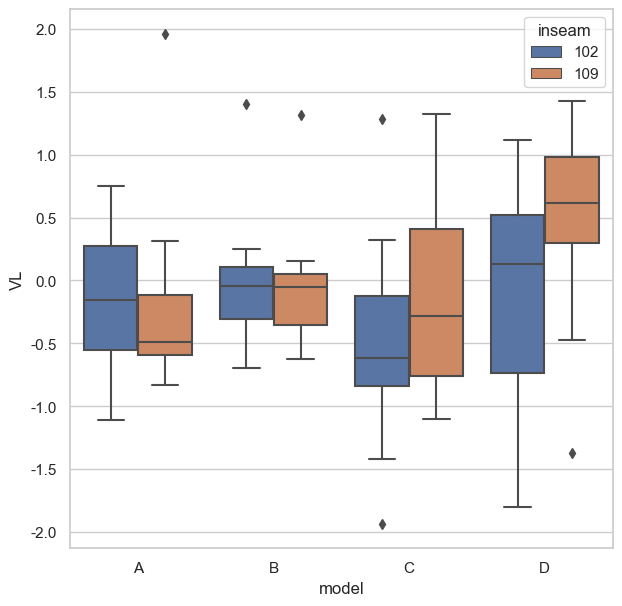

...

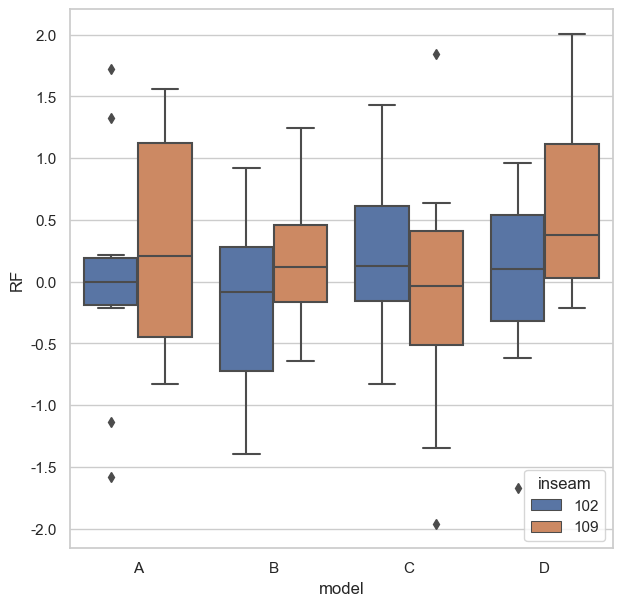

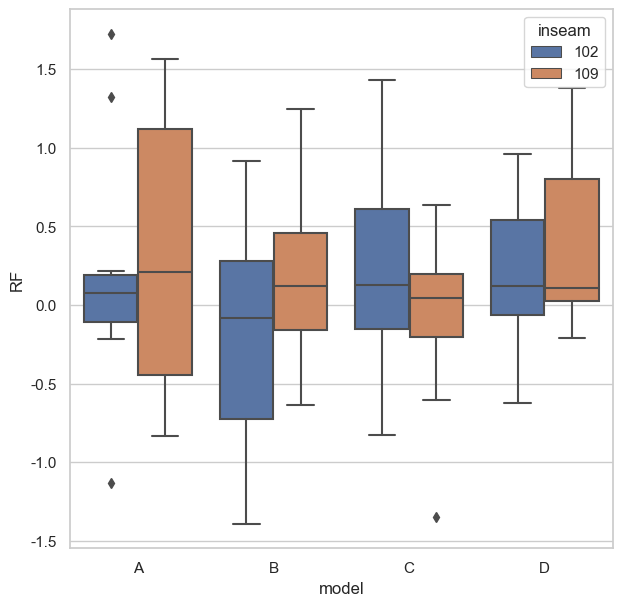

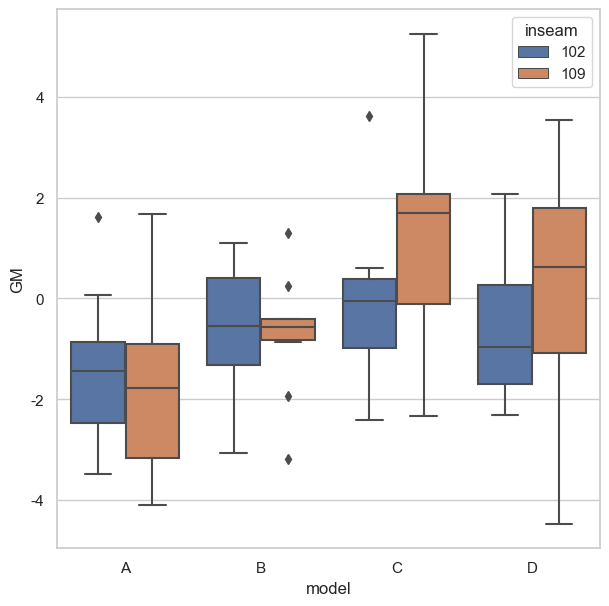

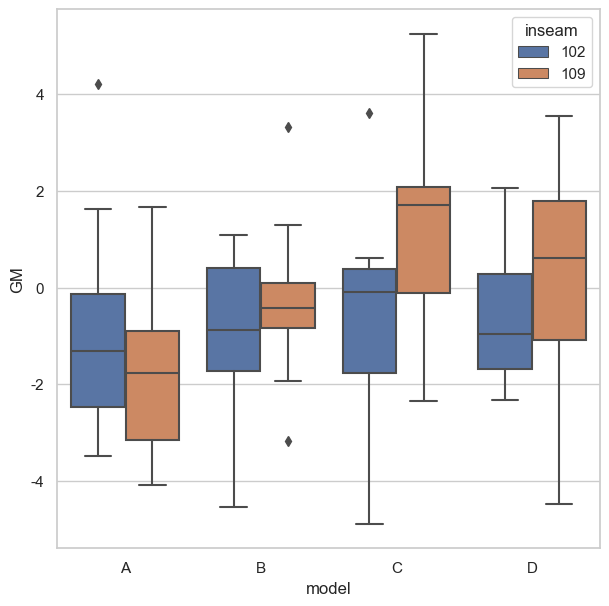

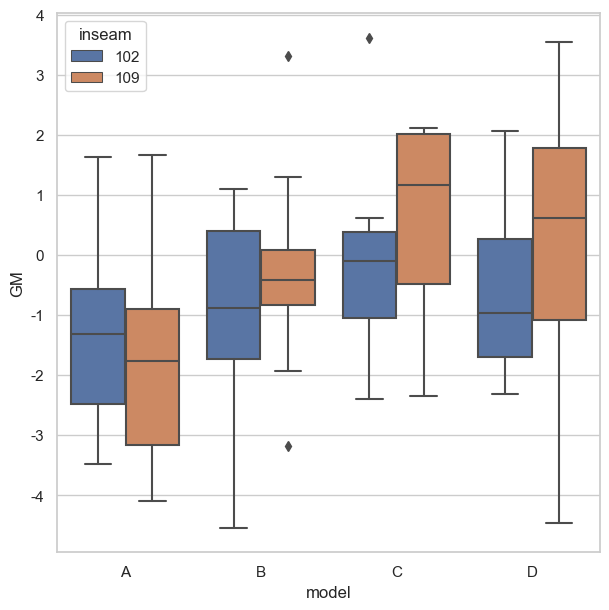

In [35]:
for col in ['BF','VL','RF','GM']:
    sns.boxplot(data=slopes_process, x = 'model',hue='inseam',y=col)
    plt.show()
    sns.boxplot(data=slopes,  x = 'model',hue='inseam',y=col)
    plt.show()
    sns.boxplot(data=sl,  x = 'model',hue='inseam',y=col)
    plt.show()    

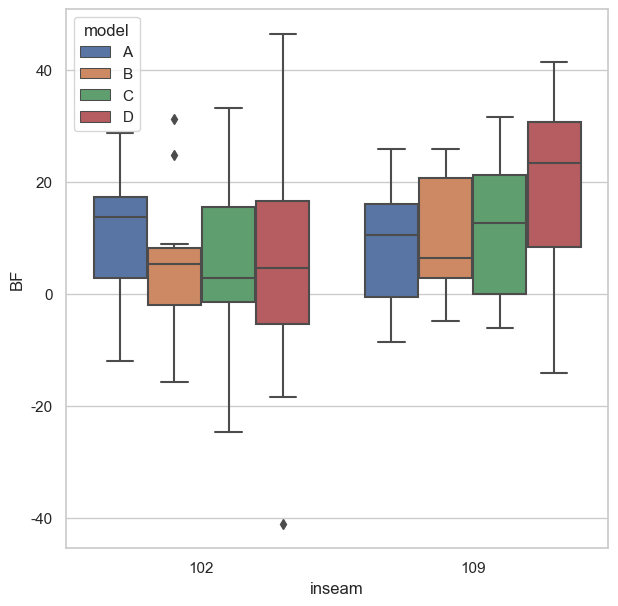

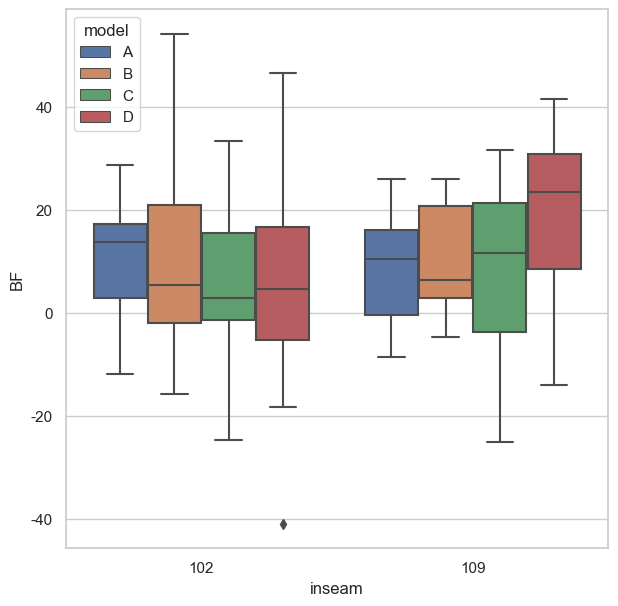

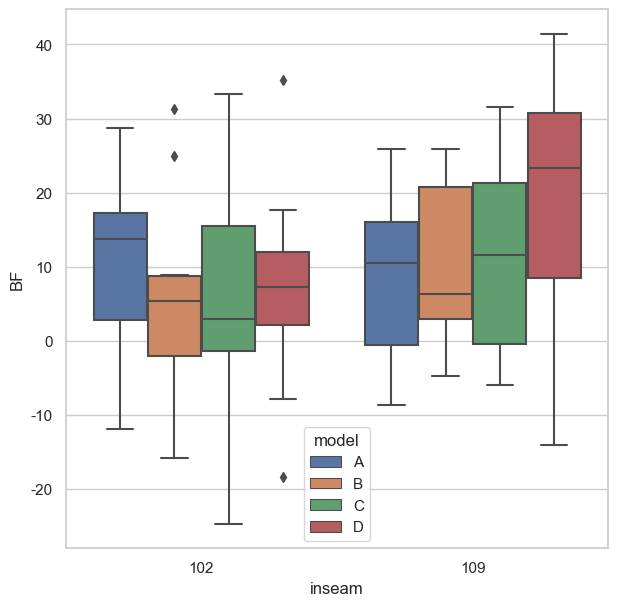

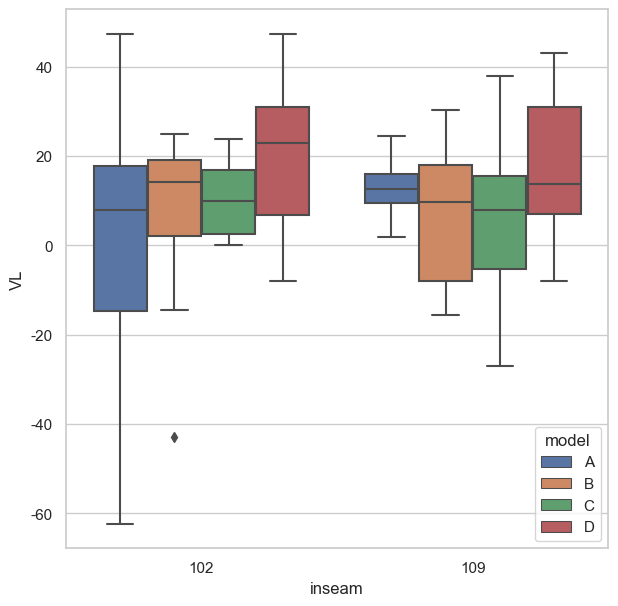

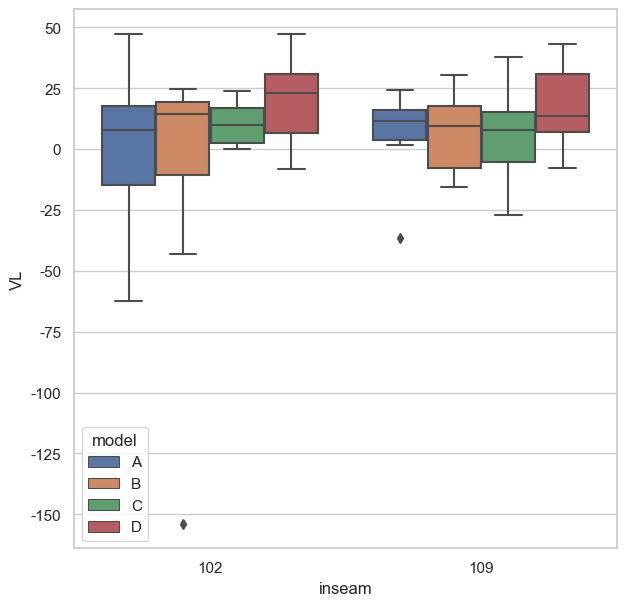

...

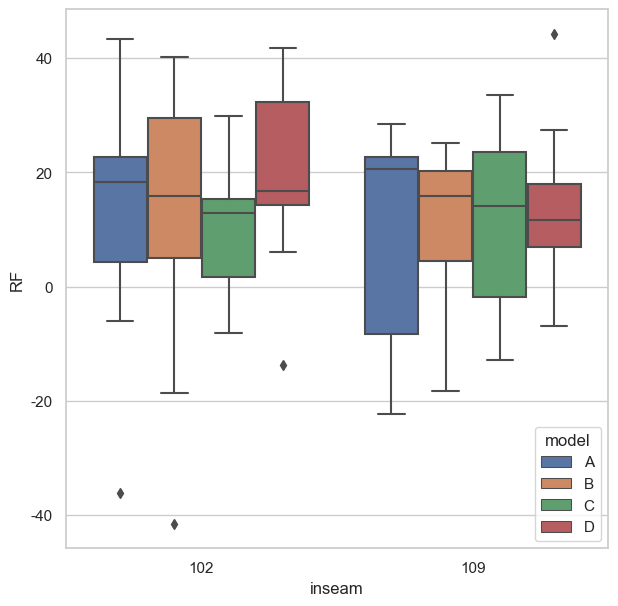

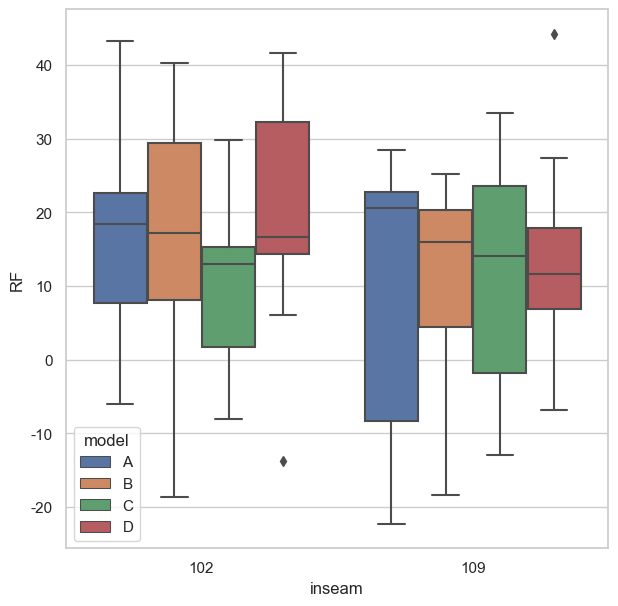

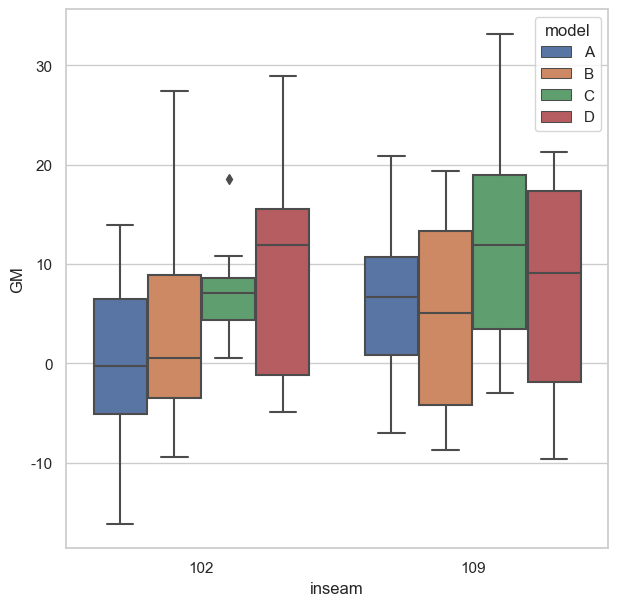

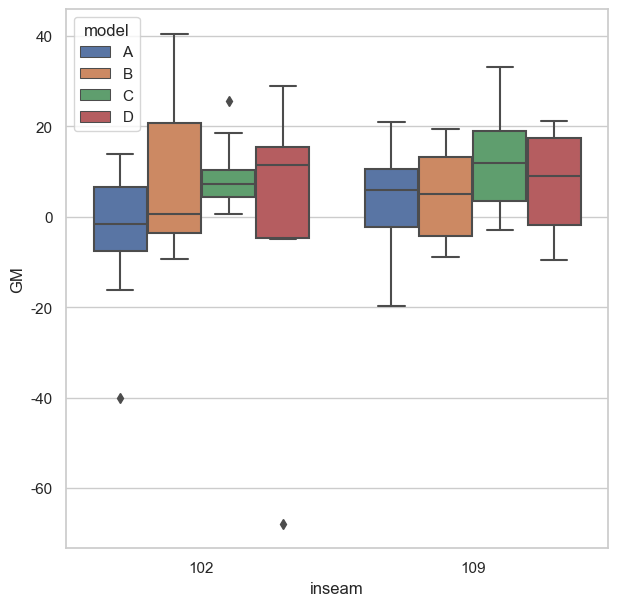

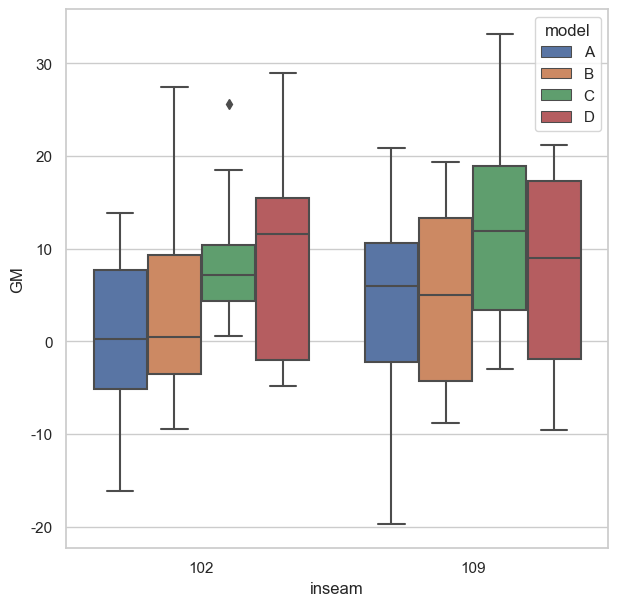

In [36]:
for col in ['BF','VL','RF','GM']:
    sns.boxplot(data=inte_process, x = 'inseam',hue='model',y=col)
    plt.show()
    sns.boxplot(data=inte_diff, x = 'inseam',hue='model',y=col)
    plt.show()
    sns.boxplot(data=inte, x = 'inseam',hue='model',y=col)
    plt.show()

In [37]:
for col in ['BF','VL','RF','GM']:
    display(pg.normality(slopes_process[col],method='normaltest'))

pg.homoscedasticity(slopes_process[['BF','VL','RF','GM']], method='levene', alpha=.05)

,W,pval,normal
BF,0.342355,0.842672,True


,W,pval,normal
VL,0.196988,0.906201,True


,W,pval,normal
RF,0.740945,0.690408,True


,W,pval,normal
GM,1.781015,0.410447,True


,W,pval,equal_var
levene,26.982245,1.457635e-15,False


In [38]:
for col in ['BF','VL','RF','GM']:
    display(pg.normality(inte_process[col], method='normaltest').round(3))
    
pg.homoscedasticity(inte_process[['BF','VL','RF','GM']], method='levene', alpha=.05)

,W,pval,normal
BF,2.167,0.338,True


,W,pval,normal
VL,20.997,0.0,False


,W,pval,normal
RF,3.046,0.218,True


,W,pval,normal
GM,2.151,0.341,True


,W,pval,equal_var
levene,3.886058,0.009454,False


### 구형성 검정

In [39]:
for col in ['BF','VL','RF','GM']:
    spher, W, chisq, dof, pval = pg.sphericity(slopes_process, dv=col, subject='subject',within=['inseam','model'])
    print(spher, round(W, 3), round(chisq, 3), dof, round(pval, 3)) 

True 0.595 4.005 5 0.552
True 0.888 0.915 5 0.969
True 0.655 3.263 5 0.662
True 0.683 2.943 5 0.711


In [40]:
for col in ['BF','VL','RF','GM']:
    spher, W, chisq, dof, pval = pg.sphericity(inte_process, dv=col, subject='subject',within=['inseam','model'])
    print(spher, round(W, 3), round(chisq, 3), dof, round(pval, 3)) 

True 0.359 7.9 5 0.165
True 0.567 4.376 5 0.5
True 0.752 2.2 5 0.822
True 0.564 4.429 5 0.493


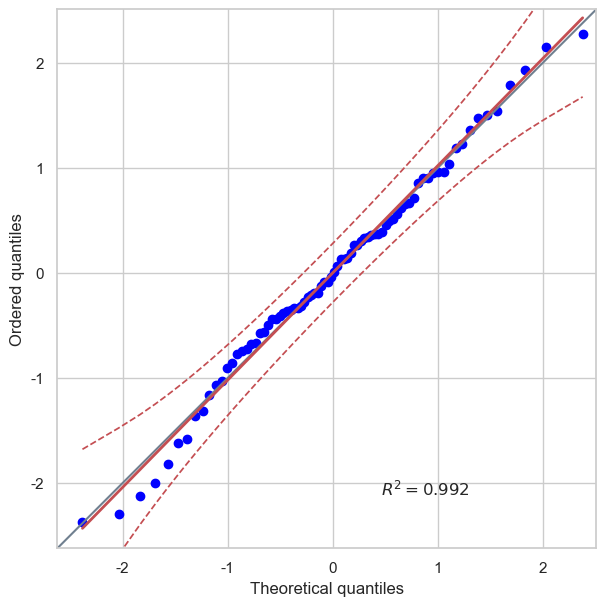

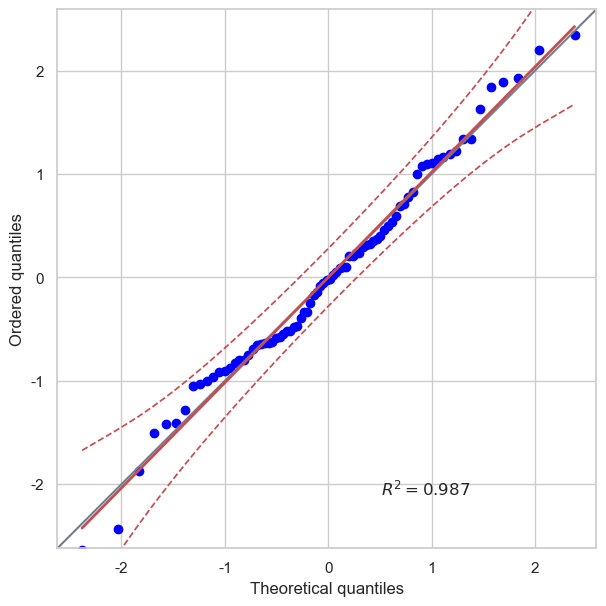

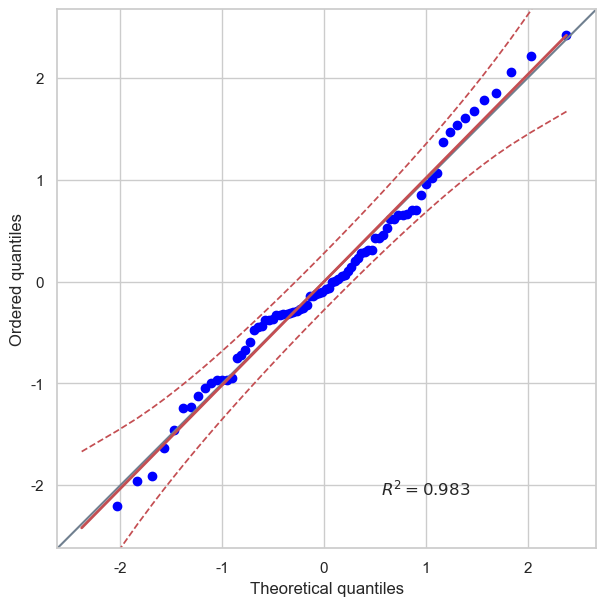

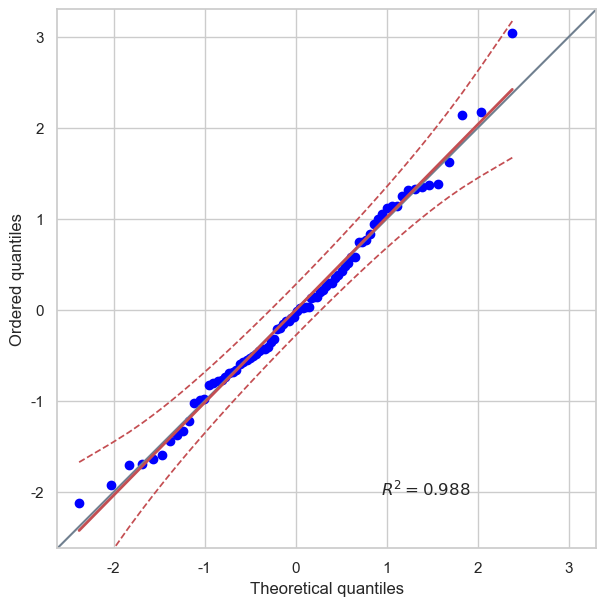

In [41]:
for col in ['BF','VL','RF','GM']:
    pg.qqplot(slopes_process[col], dist='norm')
    plt.show()

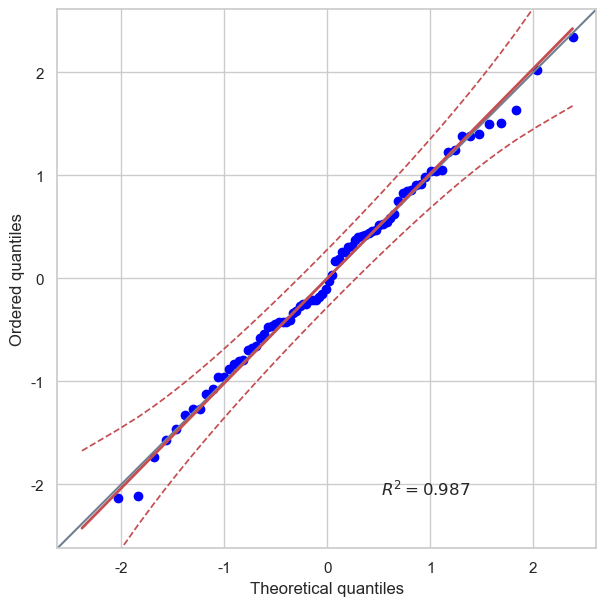

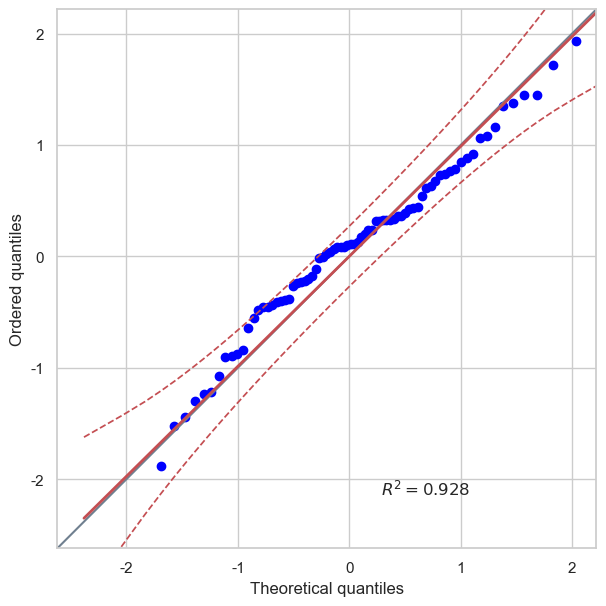

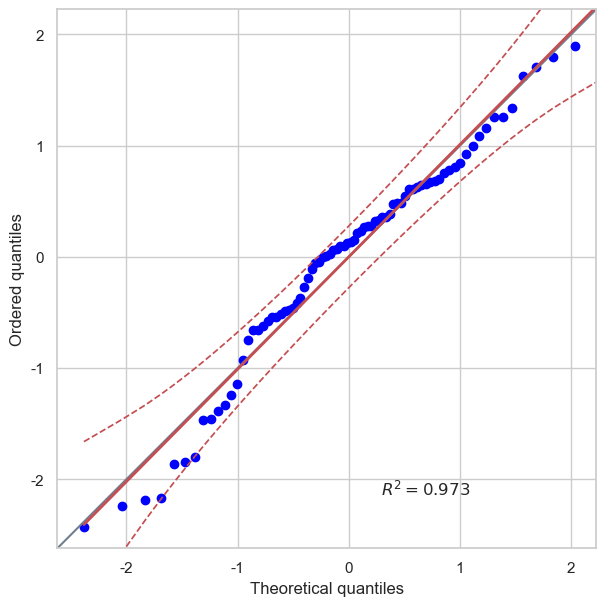

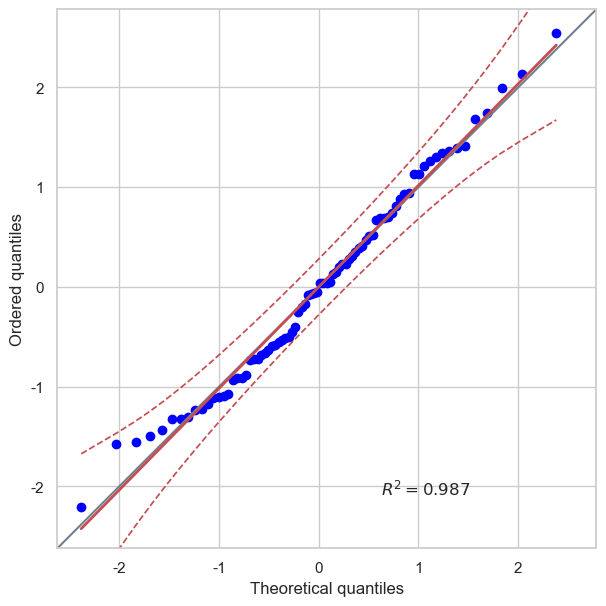

In [42]:
for col in ['BF','VL','RF','GM']:
    pg.qqplot(inte_process[col], dist='norm')
    plt.show()

In [43]:
results = pd.DataFrame()
for col in ['BF','VL','RF','GM']:
    result = pg.rm_anova(data=slopes_process, dv = col, within=['inseam','model'], subject='subject',detailed=True)
    result['muscle'] = col
    results = pd.concat([results, result])
results

# VL 상호작용
# GM 모델

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps,muscle
0,inseam,0.698724,1,9,0.698724,0.493539,0.500118,0.500118,0.008080,1.000000,BF
1,model,7.207974,3,27,2.402658,1.816891,0.167884,0.193463,0.077522,0.633004,BF
2,inseam * model,2.356751,3,27,0.785584,0.978613,0.417394,0.403389,0.026742,0.770870,BF
0,inseam,1.379031,1,9,1.379031,2.916010,0.121884,0.121884,0.050348,1.000000,VL
1,model,5.385279,3,27,1.795093,4.518096,0.010805,0.023980,0.171527,0.692996,VL
2,inseam * model,3.588862,3,27,1.196287,4.372204,0.012397,0.014504,0.121247,0.936041,VL
0,inseam,0.553857,1,9,0.553857,1.769408,0.216176,0.216176,0.012533,1.000000,RF
1,model,2.436241,3,27,0.812080,1.497300,0.237683,0.245710,0.052877,0.799939,RF
2,inseam * model,1.478471,3,27,0.492824,0.758046,0.527438,0.504459,0.032771,0.811269,RF
0,inseam,2.985074,1,9,2.985074,1.245233,0.293372,0.293372,0.012964,1.000000,GM


In [44]:
results = pd.DataFrame()
for col in ['BF','VL','RF','GM']:
    result = pg.rm_anova(data=inte_process, dv = col, within=['inseam','model'], subject='subject',detailed=True)
    result['muscle'] = col
    results = pd.concat([results, result])
results

# RF 인심 

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps,muscle
0,inseam,717.938938,1,9,717.938938,2.142675,0.177284,0.177284,0.036518,1.000000,BF
1,model,174.604175,3,27,58.201392,0.287980,0.833655,0.788137,0.009134,0.790865,BF
2,inseam * model,439.098360,3,27,146.366120,0.595758,0.623239,0.561524,0.022656,0.666089,BF
0,inseam,47.178593,1,9,47.178593,0.382172,0.551764,0.551764,0.001708,1.000000,VL
1,model,1849.625059,3,27,616.541686,1.484174,0.241109,0.247332,0.062845,0.840351,VL
2,inseam * model,900.774260,3,27,300.258087,0.885075,0.461278,0.440041,0.031625,0.758103,VL
0,inseam,869.069911,1,9,869.069911,7.808626,0.020903,0.020903,0.052810,1.000000,RF
1,model,451.377295,3,27,150.459098,0.570822,0.639054,0.555943,0.028143,0.589876,RF
2,inseam * model,570.178238,3,27,190.059413,1.007736,0.404536,0.397612,0.035288,0.859773,RF
0,inseam,128.532839,1,9,128.532839,1.607456,0.236666,0.236666,0.016418,1.000000,GM


In [45]:
pg.pairwise_tests(data=slopes_process, dv='GM',between=['inseam','model'],subject='subject',effsize='cohen',padjust='bonf')

,Contrast,inseam,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,cohen
0,inseam,-,102,109,False,True,-0.912890,78.0,two-sided,0.364113,NaN,NaN,0.334,-0.204128
1,model,-,A,B,False,True,-1.922367,38.0,two-sided,0.062080,0.372480,bonf,1.296,-0.607906
2,model,-,A,C,False,True,-3.591692,38.0,two-sided,0.000928,0.005571,bonf,33.133,-1.135793
3,model,-,A,D,False,True,-2.198911,38.0,two-sided,0.034043,0.204259,bonf,1.986,-0.695357
4,model,-,B,C,False,True,-2.274662,38.0,two-sided,0.028656,0.171938,bonf,2.251,-0.719311
5,model,-,B,D,False,True,-0.800181,38.0,two-sided,0.428580,1.000000,bonf,0.398,-0.253039
6,model,-,C,D,False,True,1.154283,38.0,two-sided,0.255592,1.000000,bonf,0.523,0.365016
7,inseam * model,102,A,B,False,True,-1.212969,18.0,two-sided,0.240821,1.000000,bonf,0.662,-0.542456
8,inseam * model,102,A,C,False,True,-1.799785,18.0,two-sided,0.088679,1.000000,bonf,1.18,-0.804889
9,inseam * model,102,A,D,False,True,-1.206325,18.0,two-sided,0.243309,1.000000,bonf,0.658,-0.539485


In [46]:
pg.pairwise_tests(data=slopes_process, dv='VL',between=['inseam','model'],subject='subject',effsize='cohen',padjust='bonf')

,Contrast,inseam,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,cohen
0,inseam,-,102,109,False,True,-1.753453,78.0,two-sided,0.083453,NaN,NaN,0.874,-0.392084
1,model,-,A,B,False,True,-0.793482,38.0,two-sided,0.432424,1.000000,bonf,0.397,-0.250921
2,model,-,A,C,False,True,0.684827,38.0,two-sided,0.497609,1.000000,bonf,0.372,0.216561
3,model,-,A,D,False,True,-2.558895,38.0,two-sided,0.014606,0.087639,bonf,3.718,-0.809194
4,model,-,B,C,False,True,1.296401,38.0,two-sided,0.202655,1.000000,bonf,0.599,0.409958
5,model,-,B,D,False,True,-2.295658,38.0,two-sided,0.027305,0.163830,bonf,2.332,-0.725951
6,model,-,C,D,False,True,-2.711944,38.0,two-sided,0.009990,0.059942,bonf,4.968,-0.857592
7,inseam * model,102,A,B,False,True,0.132219,18.0,two-sided,0.896278,1.000000,bonf,0.4,0.059130
8,inseam * model,102,A,C,False,True,2.072350,18.0,two-sided,0.052871,0.634457,bonf,1.64,0.926783
9,inseam * model,102,A,D,False,True,-0.093717,18.0,two-sided,0.926369,1.000000,bonf,0.399,-0.041911


In [47]:
pg.pairwise_tests(data=inte_process, dv='RF',between=['inseam','model'],subject='subject',effsize='cohen',padjust='bonf')

,Contrast,inseam,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,cohen
0,inseam,-,102,109,False,True,2.020231,78.0,two-sided,0.046793,NaN,NaN,1.339,0.451737
1,model,-,A,B,False,True,-0.118892,38.0,two-sided,0.905988,1.000000,bonf,0.311,-0.037597
2,model,-,A,C,False,True,0.476297,38.0,two-sided,0.636590,1.000000,bonf,0.338,0.150618
3,model,-,A,D,False,True,-0.917217,38.0,two-sided,0.364814,1.000000,bonf,0.431,-0.290050
4,model,-,B,C,False,True,0.617585,38.0,two-sided,0.540532,1.000000,bonf,0.359,0.195298
5,model,-,B,D,False,True,-0.799459,38.0,two-sided,0.428993,1.000000,bonf,0.398,-0.252811
6,model,-,C,D,False,True,-1.619895,38.0,two-sided,0.113525,0.681152,bonf,0.862,-0.512256
7,inseam * model,102,A,B,False,True,-0.113286,18.0,two-sided,0.911057,1.000000,bonf,0.399,-0.050663
8,inseam * model,102,A,C,False,True,1.228957,18.0,two-sided,0.234913,1.000000,bonf,0.67,0.549606
9,inseam * model,102,A,D,False,True,-1.217573,18.0,two-sided,0.239108,1.000000,bonf,0.664,-0.544515


In [48]:
slopes_process.to_csv('통계/non_normal_slope.csv',index=False)
# nslopes.to_csv('통계/normalized_slope.csv',index=False)
slopes_process.groupby(['model','inseam']).agg(['mean','std','count']).to_csv('통계/Slope_model_inseam_data.csv',index=False)
slopes_process.groupby(['model']).agg(['mean','std','count']).to_csv('통계/Slope_model_data.csv',index=False)
slopes_process.groupby(['inseam']).agg(['mean','std','count']).to_csv('통계/Slope_inseam_data.csv',index=False)

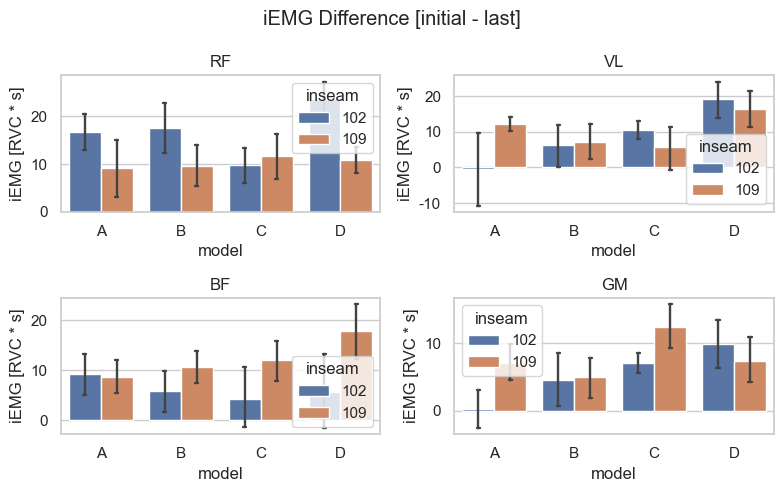

In [49]:
rcParams['figure.figsize'] = 8,5
for i, col in enumerate(inte_process.columns[:-3]):
    ax = plt.subplot(2,2,i+1)
    # sns.boxplot(data=inte_diff,x = 'model',hue='inseam', y =col)
    sns.barplot(data=inte_process,x = 'model', hue = 'inseam',y =col, ci=68, capsize=0.04,errwidth=1.7)
    plt.suptitle('iEMG Difference [initial - last]')
    ax.set_title(col)
    ax.set_ylabel(f"iEMG [RVC * s]")
    plt.tight_layout()
    
plt.savefig('figure/iemg_model_inseam_barplot.png')

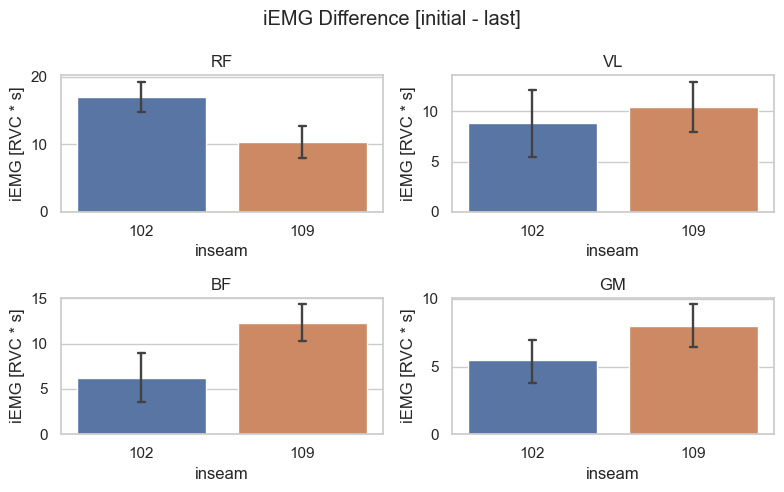

In [50]:
rcParams['figure.figsize'] = 8,5
for i, col in enumerate(inte_process.columns[:-3]):
    ax = plt.subplot(2,2,i+1)
    # sns.boxplot(data=inte_diff,x = 'model',hue='inseam', y =col)
    sns.barplot(data=inte_process,x = 'inseam', y =col, ci=68, capsize=0.04,errwidth=1.7)
    plt.suptitle('iEMG Difference [initial - last]')
    ax.set_title(col)
    ax.set_ylabel(f"iEMG [RVC * s]")
    plt.tight_layout()
    
plt.savefig('figure/iemg_inseam_barplot.png')
    

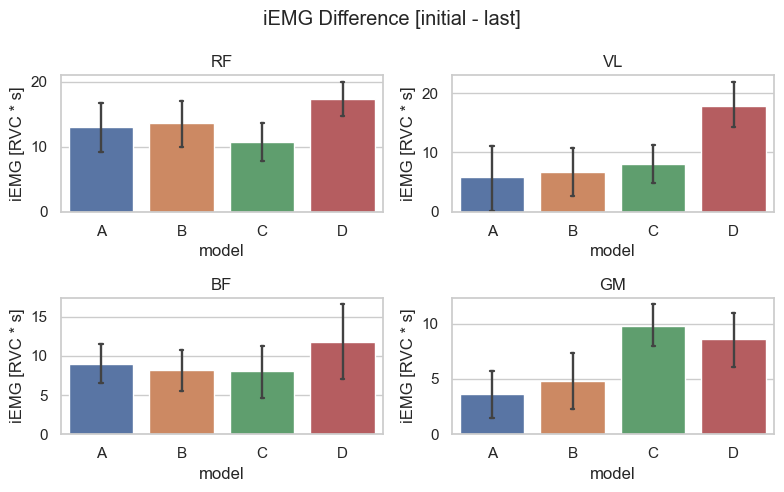

In [51]:
rcParams['figure.figsize'] = 8,5
for i, col in enumerate(inte_process.columns[:-3]):
    ax = plt.subplot(2,2,i+1)
    # sns.boxplot(data=inte_diff,x = 'model',hue='inseam', y =col)
    sns.barplot(data=inte_process,x = 'model', y =col, ci=68, capsize=0.04,errwidth=1.7)
    plt.suptitle('iEMG Difference [initial - last]')
    ax.set_title(col)
    ax.set_ylabel(f"iEMG [RVC * s]")
    plt.tight_layout()

plt.savefig('figure/iemg_model_barplot.png')

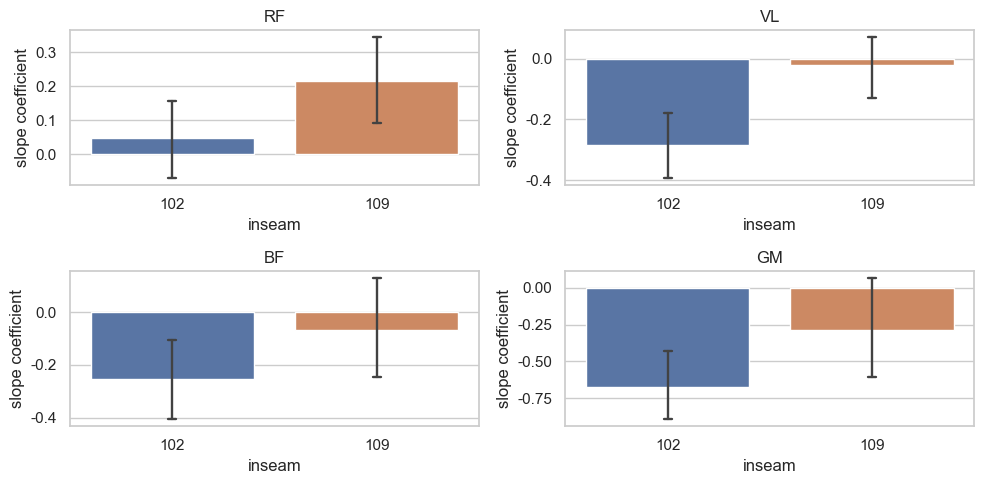

In [52]:
rcParams['figure.figsize'] = 10,5
for i, col in enumerate(slopes_process.columns[:-3]):
    ax = plt.subplot(2,2,i+1)
    # sns.boxplot(data=inte_diff,x = 'model',hue='inseam', y =col)
    sns.barplot(data=slopes_process,x = 'inseam', y =col, ci=68, capsize=0.04,errwidth=1.7)
    ax.set_title(col)
    ax.set_ylabel('slope coefficient')
    plt.tight_layout()
    
plt.savefig('figure/slope_inseam_barplot.png')

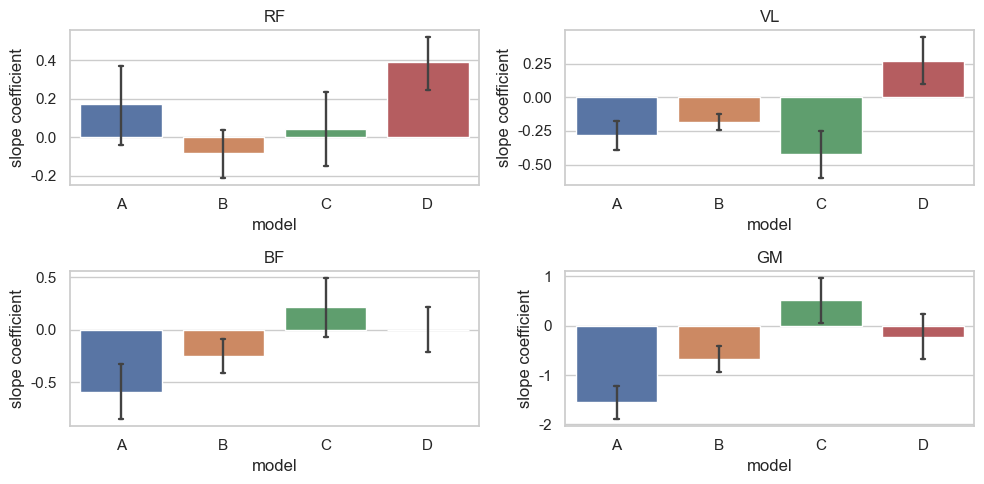

In [53]:
rcParams['figure.figsize'] = 10,5
for i, col in enumerate(slopes_process.columns[:-3]):
    ax = plt.subplot(2,2,i+1)
    # sns.boxplot(data=inte_diff,x = 'model',hue='inseam', y =col)
    sns.barplot(data=slopes_process,x = 'model', y =col, ci=68, capsize=0.04,errwidth=1.7)
    ax.set_title(col)
    ax.set_ylabel('slope coefficient')
    plt.tight_layout()
    
plt.savefig('figure/slope_model_barplot.png')

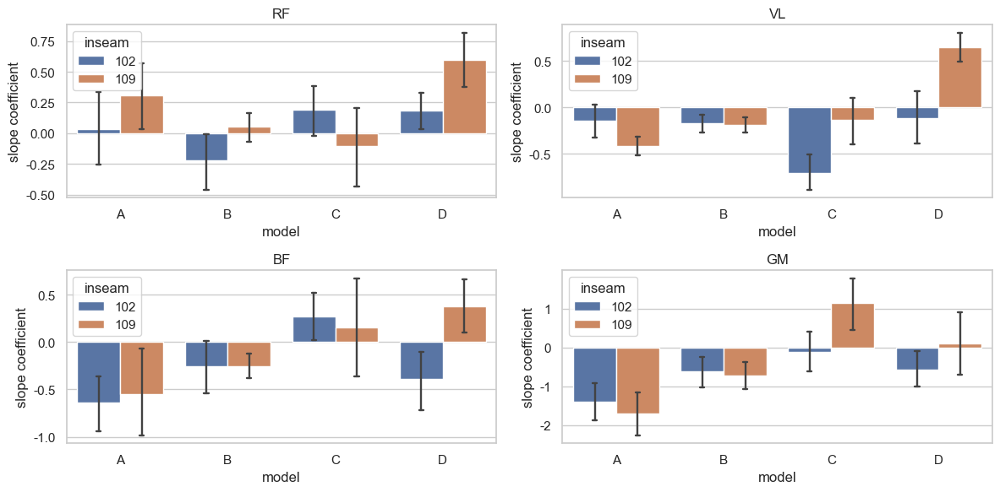

In [54]:
rcParams['figure.figsize'] = 12,6
for i, col in enumerate(slopes_process.columns[:-3]):
    ax = plt.subplot(2,2,i+1)
    # sns.boxplot(data=inte_diff,x = 'model',hue='inseam', y =col)
    sns.barplot(data=slopes_process,x = 'model', hue = 'inseam', y =col, ci=68, capsize=0.04,errwidth=1.7)
    ax.set_title(col)
    ax.set_ylabel('slope coefficient')
    plt.tight_layout()

plt.savefig('figure/slope_model_inseam_barplot.png')

### 근활성 패턴

In [55]:
start_df = {}
end_df = {}
for name in emg_rf:
    start_all = pd.DataFrame()
    end_all = pd.DataFrame()
    for i in range(len(cycles[name])):
        s = cycles[name]['start'][i][0]
        e = cycles[name]['start'][i][1]
        
        df = emg_rf[name].loc[s:e]
        dfn, b ,a = tnorma(df, step = -1001)
        dfn = pd.DataFrame(dfn)
        dfn.columns = df.columns
        start_all = pd.concat([start_all, dfn],axis=1)
        # =====================================================
        s = cycles[name]['end'][i][0]
        e = cycles[name]['end'][i][1]
        
        df = emg_rf[name].loc[s:e]
        dfn, b ,a = tnorma(df, step = -1001)
        dfn = pd.DataFrame(dfn)
        dfn.columns = df.columns
        end_all = pd.concat([end_all, dfn],axis=1)

    for col in cols:
        start_all[f"{col}_mean"] = start_all[col].mean(axis=1)
        end_all[f"{col}_mean"] = end_all[col].mean(axis=1)
        
    start_df[name] = start_all.loc[:,['RF_mean','VL_mean','BF_mean','GM_mean']]
    end_df[name] = end_all.loc[:,['RF_mean','VL_mean','BF_mean','GM_mean']]
    start_df[name].columns, end_df[name].columns = ['RF','VL','BF','GM'],['RF','VL','BF','GM']
    # start_df[name]['percent'], end_df[name]['percent'] = b, b

In [56]:
# pattern = pd.DataFrame()

# for model in ['A','B','C','D']:
#     st_102 = pd.DataFrame()
#     st_109 = pd.DataFrame()
#     ed_102 = pd.DataFrame()
#     ed_109 = pd.DataFrame()
#     data = pd.DataFrame()

#     for name in start_df:
#         inseam_1, inseam_2 = '102','109'
        
#         if (model in name.split('_')) & (inseam_1 in name.split('_')):
#             st_102 = pd.concat([st_102,start_df[name]],axis=1)
#             ed_102 = pd.concat([ed_102,end_df[name]],axis=1)

#         elif (model in name.split('_')) & (inseam_2 in name.split('_')):
#             st_109 = pd.concat([st_109,start_df[name]],axis=1)
#             ed_109 = pd.concat([ed_109,end_df[name]],axis=1)
            
#     st_102.insert(0,'percent',b);st_109.insert(0,'percent',b);ed_102.insert(0,'percent',b);ed_109.insert(0,'percent',b)
#     st_102.insert(1,'model',model);st_109.insert(1,'model',model);ed_102.insert(1,'model',model);ed_109.insert(1,'model',model)
#     st_102.insert(2,'inseam',inseam_1);st_109.insert(2,'inseam',inseam_2);ed_102.insert(2,'inseam',inseam_1);ed_109.insert(2,'inseam',inseam_2)
#     st_102.insert(3,'time','start');st_109.insert(3,'time','start');ed_102.insert(3,'time','end');ed_109.insert(3,'time','end')
    
#     data = pd.concat([st_102,ed_102,st_109,ed_109])
#     pattern = pd.concat([pattern,data])
# pattern.reset_index(inplace=True)

In [57]:
# for col in ['RF','VL','BF','GM']:
#     plt.plot(pattern[pattern['model'] == 'D'][[col]].mean(axis=1), label=col)
#     plt.legend()

In [58]:
# x = st_109['percent']
# for col,color in zip(cols, ['r','g','b','y']):
#     avg_102 = ed_102[col].mean(axis=1)
#     avg_109 = ed_109[col].mean(axis=1)
#     sd_102 = ed_102[col].std(axis=1)
#     sd_109 = ed_109[col].std(axis=1)

#     plt.plot(x, avg_102,color='b', linestyle = '--',label=f"102_{col}")
#     plt.plot(x, avg_109,color='r', label=f"109_{col}")
#     plt.fill_between(x,avg_102-sd_102,avg_102+sd_102,alpha=0.3,color='b')
#     plt.fill_between(x,avg_109-sd_109,avg_109+sd_109,alpha=0.3,color='r')
#     plt.legend()
#     plt.show()
